# Loading Data

In [17]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler, LabelEncoder
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve, auc, roc_auc_score
# Import the necessary libraries to carry out data cleaning and analysis.

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.options.display.float_format = '{:.2f}'.format
# Configure the pandas library to always show every column and record if not specified, and round figures to 2 decimal places.

path = ".."
# This term is defined to tell jupyter notebooks to step back a folder and work from there when importing data.

df = pd.read_csv(f"{path}/data/1-raw/lending-club-2007-2020Q3/Loan_status_2007-2020Q3-100ksample.csv")
# Import our dataset as a dataframe.

df.head()
# Show the first 5 records of my dataframe with all columns.

,Unnamed: 0.1,Unnamed: 0,id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,fico_range_low,fico_range_high,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,last_fico_range_high,last_fico_range_low,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_act_il,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit,revol_bal_joint,sec_app_fico_range_low,sec_app_fico_range_high,sec_app_earliest_cr_line,sec_app_inq_last_6mths,sec_app_mort_acc,sec_app_open_acc,sec_app_revol_util,sec_app_open_act_il,sec_app_num_rev_accts,sec_app_chargeoff_within_12_mths,sec_app_collections_12_mths_ex_med,hardship_flag,hardship_type,hardship_reason,hardship_status,deferral_term,hardship_amount,hardship_start_date,hardship_end_date,payment_plan_start_date,hardship_length,hardship_dpd,hardship_loan_status,orig_projected_additional_accrued_interest,hardship_payoff_balance_amount,hardship_last_payment_amount,debt_settlement_flag
0,1746494,25450,167338079,4000.00,4000.00,4000.00,36 months,13.08%,134.93,B,B5,cashier,10+ years,MORTGAGE,48000.00,Source Verified,Mar-2020,Current,n,https://lendingclub.com/browse/loanDetail.acti...,home_improvement,Home improvement,115xx,NY,20.25,1.00,Dec-2004,665.00,669.00,0.00,19.00,110.00,4.00,1.00,1988.00,82.8%,12.00,w,3816.34,3816.34,266.95,266.95,183.66,83.29,0.00,0.00,0.00,May-2020,134.93,Jun-2020,May-2020,669.00,665.00,1.00,NaN,1.00,Individual,NaN,NaN,NaN,0.00,3832.00,259024.00,0.00,1.00,0.00,1.00,16.00,9960.00,56.00,0.00,0.00,0.00,59.00,2400.00,1.00,0.00,0.00,1.00,64756.00,NaN,NaN,0.00,0.00,179.00,75.00,38.00,16.00,2.00,NaN,19.00,16.00,19.00,1.00,0.00,2.00,0.00,1.00,5.00,2.00,5.00,2.00,4.00,0.00,0.00,0.00,0.00,75.00,NaN,1.00,0.00,395328.00,11948.00,0.00,17928.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N
1,2370717,81861,71016917,24000.00,24000.00,24000.00,60 months,9.16%,500.07,B,B2,ABM,6 years,RENT,57000.00,Source Verified,Feb-2016,Current,n,https://lendingclub.com/browse/loanDetail.acti...,credit_card,Credit card refinancing,708xx,LA,25.33,0.00,Jan-2004,680.00,684.00,0.00,NaN,NaN,10.00,0.00,22697.00,64.5%,24.00,w,4333.29,4333.29,25496.16,25496.16,19666.71,5829.45,0.00,0.00,0.00,May-2020,500.07,Jun-2020,May-2020,704.00,700.00,0.00,NaN,1.00,Individual,NaN,NaN,NaN,0.00,0.00,61815.00,0.00,3.00,0.00,3.00,14.00,39118.00,72.00,1.00,1.00,2137.00,67.00,35200.00,0.00,7.00,0.00,4.00,6182.00,7741.00,40.50,0.00,0.00,145.00,137.00,7.00,7.00,0.00,7.00,NaN,24.00,NaN,0.00,3.00,5.00,5.00,6.00,15.00,7.00,9.00,5.00,10.00,0.00,0.00,0.00,1.00,95.80,60.00,0.00,0.00,88154.00,61815.00,13000.00,52954.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,NaN,NaN

# Data Cleaning & Feature Engineering

In [20]:
list_to_drop = ['Unnamed: 0.1', 'Unnamed: 0']
df = df.drop(list_to_drop, axis = 1)

I can see from the preview of the dataframe that pymnt_plan has "n" for each entry. I used the following code to check if all entries are "n" for pymnt_plan.

In [21]:
df.pymnt_plan.value_counts()

pymnt_plan
n    100000
Name: count, dtype: int64

Drop pymnt_plan because all entries are "n". Create a new dataframe without the dropped feature so I don't get confused.

In [23]:
df = df.drop(["pymnt_plan"], axis=1)

To double check I have successfully dropped the pymnt_plan feature.

In [25]:
df.head(5)

,id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,url,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,fico_range_low,fico_range_high,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,last_fico_range_high,last_fico_range_low,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_act_il,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit,revol_bal_joint,sec_app_fico_range_low,sec_app_fico_range_high,sec_app_earliest_cr_line,sec_app_inq_last_6mths,sec_app_mort_acc,sec_app_open_acc,sec_app_revol_util,sec_app_open_act_il,sec_app_num_rev_accts,sec_app_chargeoff_within_12_mths,sec_app_collections_12_mths_ex_med,hardship_flag,hardship_type,hardship_reason,hardship_status,deferral_term,hardship_amount,hardship_start_date,hardship_end_date,payment_plan_start_date,hardship_length,hardship_dpd,hardship_loan_status,orig_projected_additional_accrued_interest,hardship_payoff_balance_amount,hardship_last_payment_amount,debt_settlement_flag
0,167338079,4000.00,4000.00,4000.00,36 months,13.08%,134.93,B,B5,cashier,10+ years,MORTGAGE,48000.00,Source Verified,Mar-2020,Current,https://lendingclub.com/browse/loanDetail.acti...,home_improvement,Home improvement,115xx,NY,20.25,1.00,Dec-2004,665.00,669.00,0.00,19.00,110.00,4.00,1.00,1988.00,82.8%,12.00,w,3816.34,3816.34,266.95,266.95,183.66,83.29,0.00,0.00,0.00,May-2020,134.93,Jun-2020,May-2020,669.00,665.00,1.00,NaN,1.00,Individual,NaN,NaN,NaN,0.00,3832.00,259024.00,0.00,1.00,0.00,1.00,16.00,9960.00,56.00,0.00,0.00,0.00,59.00,2400.00,1.00,0.00,0.00,1.00,64756.00,NaN,NaN,0.00,0.00,179.00,75.00,38.00,16.00,2.00,NaN,19.00,16.00,19.00,1.00,0.00,2.00,0.00,1.00,5.00,2.00,5.00,2.00,4.00,0.00,0.00,0.00,0.00,75.00,NaN,1.00,0.00,395328.00,11948.00,0.00,17928.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N
1,71016917,24000.00,24000.00,24000.00,60 months,9.16%,500.07,B,B2,ABM,6 years,RENT,57000.00,Source Verified,Feb-2016,Current,https://lendingclub.com/browse/loanDetail.acti...,credit_card,Credit card refinancing,708xx,LA,25.33,0.00,Jan-2004,680.00,684.00,0.00,NaN,NaN,10.00,0.00,22697.00,64.5%,24.00,w,4333.29,4333.29,25496.16,25496.16,19666.71,5829.45,0.00,0.00,0.00,May-2020,500.07,Jun-2020,May-2020,704.00,700.00,0.00,NaN,1.00,Individual,NaN,NaN,NaN,0.00,0.00,61815.00,0.00,3.00,0.00,3.00,14.00,39118.00,72.00,1.00,1.00,2137.00,67.00,35200.00,0.00,7.00,0.00,4.00,6182.00,7741.00,40.50,0.00,0.00,145.00,137.00,7.00,7.00,0.00,7.00,NaN,24.00,NaN,0.00,3.00,5.00,5.00,6.00,15.00,7.00,9.00,5.00,10.00,0.00,0.00,0.00,1.00,95.80,60.00,0.00,0.00,88154.00,61815.00,13000.00,52954.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N
2,39589826,5000.

In [26]:
df.isnull().sum()

id                                                0
loan_amnt                                         0
funded_amnt                                       0
funded_amnt_inv                                   0
term                                              0
int_rate                                          0
installment                                       0
grade                                             0
sub_grade                                         0
emp_title                                      8954
emp_length                                     6950
home_ownership                                    0
annual_inc                                        0
verification_status                               0
issue_d                                           0
loan_status                                       0
url                                               0
purpose                                           0
title                                           780
zip_code    

In [27]:
df.revol_util.isnull()

0        False
1        False
2        False
3        False
4        False
5        False
6        False
7        False
8        False
9        False
10       False
11       False
12       False
13        True
14       False
15       False
16       False
17       False
18       False
19       False
20       False
21       False
22       False
23       False
24       False
25       False
26       False
27       False
28       False
29       False
30       False
31       False
32       False
33       False
34       False
35       False
36       False
37       False
38       False
39       False
40       False
41       False
42       False
43       False
44       False
45       False
46       False
47       False
48       False
49       False
50       False
51       False
52       False
53       False
54       False
55       False
56       False
57       False
58       False
59       False
60       False
61       False
62       False
63       False
64       False
65       False
66       F

I can see from the few lines of code above that revol_util returns null values for some customers. I will assume that this is due to customers not owning a credit card, allowing them access to revolving credit. In this scenario it would be best to impute these null values to 0 given that customers are technically not utilising any revolving credit.

In [29]:
df['revol_util'].fillna('0%', inplace=True)

C:\Users\rubel\AppData\Local\Temp\ipykernel_5204\4081629735.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['revol_util'].fillna('0%', inplace=True)


In [30]:
print(f"Nulls after filling: {df['revol_util'].isnull().sum()}")

Nulls after filling: 0


I have used the 2 previous lines of code to impute the nulls, replacing them with 0, and check if this was successful.

In [32]:
df.revol_util.describe()
# Investigate the revolving balance utilisation feature.

count     100000
unique      1088
top           0%
freq         719
Name: revol_util, dtype: object

In [33]:
df['revol_util_clean'] = df['revol_util'].str.rstrip('%').astype('float') / 100.0
df.head(15)

,id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,url,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,fico_range_low,fico_range_high,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,last_fico_range_high,last_fico_range_low,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_act_il,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit,revol_bal_joint,sec_app_fico_range_low,sec_app_fico_range_high,sec_app_earliest_cr_line,sec_app_inq_last_6mths,sec_app_mort_acc,sec_app_open_acc,sec_app_revol_util,sec_app_open_act_il,sec_app_num_rev_accts,sec_app_chargeoff_within_12_mths,sec_app_collections_12_mths_ex_med,hardship_flag,hardship_type,hardship_reason,hardship_status,deferral_term,hardship_amount,hardship_start_date,hardship_end_date,payment_plan_start_date,hardship_length,hardship_dpd,hardship_loan_status,orig_projected_additional_accrued_interest,hardship_payoff_balance_amount,hardship_last_payment_amount,debt_settlement_flag,revol_util_clean
0,167338079,4000.00,4000.00,4000.00,36 months,13.08%,134.93,B,B5,cashier,10+ years,MORTGAGE,48000.00,Source Verified,Mar-2020,Current,https://lendingclub.com/browse/loanDetail.acti...,home_improvement,Home improvement,115xx,NY,20.25,1.00,Dec-2004,665.00,669.00,0.00,19.00,110.00,4.00,1.00,1988.00,82.8%,12.00,w,3816.34,3816.34,266.95,266.95,183.66,83.29,0.00,0.00,0.00,May-2020,134.93,Jun-2020,May-2020,669.00,665.00,1.00,NaN,1.00,Individual,NaN,NaN,NaN,0.00,3832.00,259024.00,0.00,1.00,0.00,1.00,16.00,9960.00,56.00,0.00,0.00,0.00,59.00,2400.00,1.00,0.00,0.00,1.00,64756.00,NaN,NaN,0.00,0.00,179.00,75.00,38.00,16.00,2.00,NaN,19.00,16.00,19.00,1.00,0.00,2.00,0.00,1.00,5.00,2.00,5.00,2.00,4.00,0.00,0.00,0.00,0.00,75.00,NaN,1.00,0.00,395328.00,11948.00,0.00,17928.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,0.83
1,71016917,24000.00,24000.00,24000.00,60 months,9.16%,500.07,B,B2,ABM,6 years,RENT,57000.00,Source Verified,Feb-2016,Current,https://lendingclub.com/browse/loanDetail.acti...,credit_card,Credit card refinancing,708xx,LA,25.33,0.00,Jan-2004,680.00,684.00,0.00,NaN,NaN,10.00,0.00,22697.00,64.5%,24.00,w,4333.29,4333.29,25496.16,25496.16,19666.71,5829.45,0.00,0.00,0.00,May-2020,500.07,Jun-2020,May-2020,704.00,700.00,0.00,NaN,1.00,Individual,NaN,NaN,NaN,0.00,0.00,61815.00,0.00,3.00,0.00,3.00,14.00,39118.00,72.00,1.00,1.00,2137.00,67.00,35200.00,0.00,7.00,0.00,4.00,6182.00,7741.00,40.50,0.00,0.00,145.00,137.00,7.00,7.00,0.00,7.00,NaN,24.00,NaN,0.00,3.00,5.00,5.00,6.00,15.00,7.00,9.00,5.00,10.00,0.00,0.00,0.00,1.00,95.80,60.00,0.00,0.00,88154.00,61815.00,13000.00,52954.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [34]:
df.revol_util_clean.fillna(0, inplace=True)
df.head(15)

C:\Users\rubel\AppData\Local\Temp\ipykernel_5204\2235775358.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df.revol_util_clean.fillna(0, inplace=True)


,id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,url,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,fico_range_low,fico_range_high,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,last_fico_range_high,last_fico_range_low,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_act_il,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit,revol_bal_joint,sec_app_fico_range_low,sec_app_fico_range_high,sec_app_earliest_cr_line,sec_app_inq_last_6mths,sec_app_mort_acc,sec_app_open_acc,sec_app_revol_util,sec_app_open_act_il,sec_app_num_rev_accts,sec_app_chargeoff_within_12_mths,sec_app_collections_12_mths_ex_med,hardship_flag,hardship_type,hardship_reason,hardship_status,deferral_term,hardship_amount,hardship_start_date,hardship_end_date,payment_plan_start_date,hardship_length,hardship_dpd,hardship_loan_status,orig_projected_additional_accrued_interest,hardship_payoff_balance_amount,hardship_last_payment_amount,debt_settlement_flag,revol_util_clean
0,167338079,4000.00,4000.00,4000.00,36 months,13.08%,134.93,B,B5,cashier,10+ years,MORTGAGE,48000.00,Source Verified,Mar-2020,Current,https://lendingclub.com/browse/loanDetail.acti...,home_improvement,Home improvement,115xx,NY,20.25,1.00,Dec-2004,665.00,669.00,0.00,19.00,110.00,4.00,1.00,1988.00,82.8%,12.00,w,3816.34,3816.34,266.95,266.95,183.66,83.29,0.00,0.00,0.00,May-2020,134.93,Jun-2020,May-2020,669.00,665.00,1.00,NaN,1.00,Individual,NaN,NaN,NaN,0.00,3832.00,259024.00,0.00,1.00,0.00,1.00,16.00,9960.00,56.00,0.00,0.00,0.00,59.00,2400.00,1.00,0.00,0.00,1.00,64756.00,NaN,NaN,0.00,0.00,179.00,75.00,38.00,16.00,2.00,NaN,19.00,16.00,19.00,1.00,0.00,2.00,0.00,1.00,5.00,2.00,5.00,2.00,4.00,0.00,0.00,0.00,0.00,75.00,NaN,1.00,0.00,395328.00,11948.00,0.00,17928.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,0.83
1,71016917,24000.00,24000.00,24000.00,60 months,9.16%,500.07,B,B2,ABM,6 years,RENT,57000.00,Source Verified,Feb-2016,Current,https://lendingclub.com/browse/loanDetail.acti...,credit_card,Credit card refinancing,708xx,LA,25.33,0.00,Jan-2004,680.00,684.00,0.00,NaN,NaN,10.00,0.00,22697.00,64.5%,24.00,w,4333.29,4333.29,25496.16,25496.16,19666.71,5829.45,0.00,0.00,0.00,May-2020,500.07,Jun-2020,May-2020,704.00,700.00,0.00,NaN,1.00,Individual,NaN,NaN,NaN,0.00,0.00,61815.00,0.00,3.00,0.00,3.00,14.00,39118.00,72.00,1.00,1.00,2137.00,67.00,35200.00,0.00,7.00,0.00,4.00,6182.00,7741.00,40.50,0.00,0.00,145.00,137.00,7.00,7.00,0.00,7.00,NaN,24.00,NaN,0.00,3.00,5.00,5.00,6.00,15.00,7.00,9.00,5.00,10.00,0.00,0.00,0.00,1.00,95.80,60.00,0.00,0.00,88154.00,61815.00,13000.00,52954.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [35]:
df['int_rate_clean'] = df['int_rate'].str.rstrip('%').astype('float') / 100.0
df.head(15)

,id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,url,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,fico_range_low,fico_range_high,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,last_fico_range_high,last_fico_range_low,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_act_il,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit,revol_bal_joint,sec_app_fico_range_low,sec_app_fico_range_high,sec_app_earliest_cr_line,sec_app_inq_last_6mths,sec_app_mort_acc,sec_app_open_acc,sec_app_revol_util,sec_app_open_act_il,sec_app_num_rev_accts,sec_app_chargeoff_within_12_mths,sec_app_collections_12_mths_ex_med,hardship_flag,hardship_type,hardship_reason,hardship_status,deferral_term,hardship_amount,hardship_start_date,hardship_end_date,payment_plan_start_date,hardship_length,hardship_dpd,hardship_loan_status,orig_projected_additional_accrued_interest,hardship_payoff_balance_amount,hardship_last_payment_amount,debt_settlement_flag,revol_util_clean,int_rate_clean
0,167338079,4000.00,4000.00,4000.00,36 months,13.08%,134.93,B,B5,cashier,10+ years,MORTGAGE,48000.00,Source Verified,Mar-2020,Current,https://lendingclub.com/browse/loanDetail.acti...,home_improvement,Home improvement,115xx,NY,20.25,1.00,Dec-2004,665.00,669.00,0.00,19.00,110.00,4.00,1.00,1988.00,82.8%,12.00,w,3816.34,3816.34,266.95,266.95,183.66,83.29,0.00,0.00,0.00,May-2020,134.93,Jun-2020,May-2020,669.00,665.00,1.00,NaN,1.00,Individual,NaN,NaN,NaN,0.00,3832.00,259024.00,0.00,1.00,0.00,1.00,16.00,9960.00,56.00,0.00,0.00,0.00,59.00,2400.00,1.00,0.00,0.00,1.00,64756.00,NaN,NaN,0.00,0.00,179.00,75.00,38.00,16.00,2.00,NaN,19.00,16.00,19.00,1.00,0.00,2.00,0.00,1.00,5.00,2.00,5.00,2.00,4.00,0.00,0.00,0.00,0.00,75.00,NaN,1.00,0.00,395328.00,11948.00,0.00,17928.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,0.83,0.13
1,71016917,24000.00,24000.00,24000.00,60 months,9.16%,500.07,B,B2,ABM,6 years,RENT,57000.00,Source Verified,Feb-2016,Current,https://lendingclub.com/browse/loanDetail.acti...,credit_card,Credit card refinancing,708xx,LA,25.33,0.00,Jan-2004,680.00,684.00,0.00,NaN,NaN,10.00,0.00,22697.00,64.5%,24.00,w,4333.29,4333.29,25496.16,25496.16,19666.71,5829.45,0.00,0.00,0.00,May-2020,500.07,Jun-2020,May-2020,704.00,700.00,0.00,NaN,1.00,Individual,NaN,NaN,NaN,0.00,0.00,61815.00,0.00,3.00,0.00,3.00,14.00,39118.00,72.00,1.00,1.00,2137.00,67.00,35200.00,0.00,7.00,0.00,4.00,6182.00,7741.00,40.50,0.00,0.00,145.00,137.00,7.00,7.00,0.00,7.00,NaN,24.00,NaN,0.00,3.00,5.00,5.00,6.00,15.00,7.00,9.00,5.00,10.00,0.00,0.00,0.00,1.00,95.80,60.00,0.00,0.00,88154.00,61815.00,13000.00,52954.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [36]:
df.int_rate_clean.fillna(0, inplace=True)
df.head(5)

C:\Users\rubel\AppData\Local\Temp\ipykernel_5204\442746583.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df.int_rate_clean.fillna(0, inplace=True)


,id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,url,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,fico_range_low,fico_range_high,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,last_fico_range_high,last_fico_range_low,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_act_il,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit,revol_bal_joint,sec_app_fico_range_low,sec_app_fico_range_high,sec_app_earliest_cr_line,sec_app_inq_last_6mths,sec_app_mort_acc,sec_app_open_acc,sec_app_revol_util,sec_app_open_act_il,sec_app_num_rev_accts,sec_app_chargeoff_within_12_mths,sec_app_collections_12_mths_ex_med,hardship_flag,hardship_type,hardship_reason,hardship_status,deferral_term,hardship_amount,hardship_start_date,hardship_end_date,payment_plan_start_date,hardship_length,hardship_dpd,hardship_loan_status,orig_projected_additional_accrued_interest,hardship_payoff_balance_amount,hardship_last_payment_amount,debt_settlement_flag,revol_util_clean,int_rate_clean
0,167338079,4000.00,4000.00,4000.00,36 months,13.08%,134.93,B,B5,cashier,10+ years,MORTGAGE,48000.00,Source Verified,Mar-2020,Current,https://lendingclub.com/browse/loanDetail.acti...,home_improvement,Home improvement,115xx,NY,20.25,1.00,Dec-2004,665.00,669.00,0.00,19.00,110.00,4.00,1.00,1988.00,82.8%,12.00,w,3816.34,3816.34,266.95,266.95,183.66,83.29,0.00,0.00,0.00,May-2020,134.93,Jun-2020,May-2020,669.00,665.00,1.00,NaN,1.00,Individual,NaN,NaN,NaN,0.00,3832.00,259024.00,0.00,1.00,0.00,1.00,16.00,9960.00,56.00,0.00,0.00,0.00,59.00,2400.00,1.00,0.00,0.00,1.00,64756.00,NaN,NaN,0.00,0.00,179.00,75.00,38.00,16.00,2.00,NaN,19.00,16.00,19.00,1.00,0.00,2.00,0.00,1.00,5.00,2.00,5.00,2.00,4.00,0.00,0.00,0.00,0.00,75.00,NaN,1.00,0.00,395328.00,11948.00,0.00,17928.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,0.83,0.13
1,71016917,24000.00,24000.00,24000.00,60 months,9.16%,500.07,B,B2,ABM,6 years,RENT,57000.00,Source Verified,Feb-2016,Current,https://lendingclub.com/browse/loanDetail.acti...,credit_card,Credit card refinancing,708xx,LA,25.33,0.00,Jan-2004,680.00,684.00,0.00,NaN,NaN,10.00,0.00,22697.00,64.5%,24.00,w,4333.29,4333.29,25496.16,25496.16,19666.71,5829.45,0.00,0.00,0.00,May-2020,500.07,Jun-2020,May-2020,704.00,700.00,0.00,NaN,1.00,Individual,NaN,NaN,NaN,0.00,0.00,61815.00,0.00,3.00,0.00,3.00,14.00,39118.00,72.00,1.00,1.00,2137.00,67.00,35200.00,0.00,7.00,0.00,4.00,6182.00,7741.00,40.50,0.00,0.00,145.00,137.00,7.00,7.00,0.00,7.00,NaN,24.00,NaN,0.00,3.00,5.00,5.00,6.00,15.00,7.00,9.00,5.00,10.00,0.00,0.00,0.00,1.00,95.80,60.00,0.00,0.00,88154.00,61815.00,13000.00,52954.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

Because revol_util and int_rate are regarded as an object, I have stripped the '%' sign and converted it to a float like we did with the interest rate in class.

In [38]:
df['loan_default'] = df.loan_status == "Charged Off"
df['loan_default'].value_counts()

loan_default
False    87616
True     12384
Name: count, dtype: int64

In [39]:
df.head(5)

,id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,url,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,fico_range_low,fico_range_high,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,last_fico_range_high,last_fico_range_low,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_act_il,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit,revol_bal_joint,sec_app_fico_range_low,sec_app_fico_range_high,sec_app_earliest_cr_line,sec_app_inq_last_6mths,sec_app_mort_acc,sec_app_open_acc,sec_app_revol_util,sec_app_open_act_il,sec_app_num_rev_accts,sec_app_chargeoff_within_12_mths,sec_app_collections_12_mths_ex_med,hardship_flag,hardship_type,hardship_reason,hardship_status,deferral_term,hardship_amount,hardship_start_date,hardship_end_date,payment_plan_start_date,hardship_length,hardship_dpd,hardship_loan_status,orig_projected_additional_accrued_interest,hardship_payoff_balance_amount,hardship_last_payment_amount,debt_settlement_flag,revol_util_clean,int_rate_clean,loan_default
0,167338079,4000.00,4000.00,4000.00,36 months,13.08%,134.93,B,B5,cashier,10+ years,MORTGAGE,48000.00,Source Verified,Mar-2020,Current,https://lendingclub.com/browse/loanDetail.acti...,home_improvement,Home improvement,115xx,NY,20.25,1.00,Dec-2004,665.00,669.00,0.00,19.00,110.00,4.00,1.00,1988.00,82.8%,12.00,w,3816.34,3816.34,266.95,266.95,183.66,83.29,0.00,0.00,0.00,May-2020,134.93,Jun-2020,May-2020,669.00,665.00,1.00,NaN,1.00,Individual,NaN,NaN,NaN,0.00,3832.00,259024.00,0.00,1.00,0.00,1.00,16.00,9960.00,56.00,0.00,0.00,0.00,59.00,2400.00,1.00,0.00,0.00,1.00,64756.00,NaN,NaN,0.00,0.00,179.00,75.00,38.00,16.00,2.00,NaN,19.00,16.00,19.00,1.00,0.00,2.00,0.00,1.00,5.00,2.00,5.00,2.00,4.00,0.00,0.00,0.00,0.00,75.00,NaN,1.00,0.00,395328.00,11948.00,0.00,17928.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,0.83,0.13,False
1,71016917,24000.00,24000.00,24000.00,60 months,9.16%,500.07,B,B2,ABM,6 years,RENT,57000.00,Source Verified,Feb-2016,Current,https://lendingclub.com/browse/loanDetail.acti...,credit_card,Credit card refinancing,708xx,LA,25.33,0.00,Jan-2004,680.00,684.00,0.00,NaN,NaN,10.00,0.00,22697.00,64.5%,24.00,w,4333.29,4333.29,25496.16,25496.16,19666.71,5829.45,0.00,0.00,0.00,May-2020,500.07,Jun-2020,May-2020,704.00,700.00,0.00,NaN,1.00,Individual,NaN,NaN,NaN,0.00,0.00,61815.00,0.00,3.00,0.00,3.00,14.00,39118.00,72.00,1.00,1.00,2137.00,67.00,35200.00,0.00,7.00,0.00,4.00,6182.00,7741.00,40.50,0.00,0.00,145.00,137.00,7.00,7.00,0.00,7.00,NaN,24.00,NaN,0.00,3.00,5.00,5.00,6.00,15.00,7.00,9.00,5.00,10.00,0.00,0.00,0.00,1.00,95.80,60.00,0.00,0.00,88154.00,61815.00,13000.00,52954.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,NaN,NaN,NaN,N

In [40]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
df['grade_encoded'] = le.fit_transform(df['grade'])
df[['grade', 'grade_encoded']].head()

,grade,grade_encoded
0,B,1
1,B,1
2,B,1
3,B,1
4,C,2


In [41]:
df.head(10)

,id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,url,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,fico_range_low,fico_range_high,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,last_fico_range_high,last_fico_range_low,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_act_il,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit,revol_bal_joint,sec_app_fico_range_low,sec_app_fico_range_high,sec_app_earliest_cr_line,sec_app_inq_last_6mths,sec_app_mort_acc,sec_app_open_acc,sec_app_revol_util,sec_app_open_act_il,sec_app_num_rev_accts,sec_app_chargeoff_within_12_mths,sec_app_collections_12_mths_ex_med,hardship_flag,hardship_type,hardship_reason,hardship_status,deferral_term,hardship_amount,hardship_start_date,hardship_end_date,payment_plan_start_date,hardship_length,hardship_dpd,hardship_loan_status,orig_projected_additional_accrued_interest,hardship_payoff_balance_amount,hardship_last_payment_amount,debt_settlement_flag,revol_util_clean,int_rate_clean,loan_default,grade_encoded
0,167338079,4000.00,4000.00,4000.00,36 months,13.08%,134.93,B,B5,cashier,10+ years,MORTGAGE,48000.00,Source Verified,Mar-2020,Current,https://lendingclub.com/browse/loanDetail.acti...,home_improvement,Home improvement,115xx,NY,20.25,1.00,Dec-2004,665.00,669.00,0.00,19.00,110.00,4.00,1.00,1988.00,82.8%,12.00,w,3816.34,3816.34,266.95,266.95,183.66,83.29,0.00,0.00,0.00,May-2020,134.93,Jun-2020,May-2020,669.00,665.00,1.00,NaN,1.00,Individual,NaN,NaN,NaN,0.00,3832.00,259024.00,0.00,1.00,0.00,1.00,16.00,9960.00,56.00,0.00,0.00,0.00,59.00,2400.00,1.00,0.00,0.00,1.00,64756.00,NaN,NaN,0.00,0.00,179.00,75.00,38.00,16.00,2.00,NaN,19.00,16.00,19.00,1.00,0.00,2.00,0.00,1.00,5.00,2.00,5.00,2.00,4.00,0.00,0.00,0.00,0.00,75.00,NaN,1.00,0.00,395328.00,11948.00,0.00,17928.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,0.83,0.13,False,1
1,71016917,24000.00,24000.00,24000.00,60 months,9.16%,500.07,B,B2,ABM,6 years,RENT,57000.00,Source Verified,Feb-2016,Current,https://lendingclub.com/browse/loanDetail.acti...,credit_card,Credit card refinancing,708xx,LA,25.33,0.00,Jan-2004,680.00,684.00,0.00,NaN,NaN,10.00,0.00,22697.00,64.5%,24.00,w,4333.29,4333.29,25496.16,25496.16,19666.71,5829.45,0.00,0.00,0.00,May-2020,500.07,Jun-2020,May-2020,704.00,700.00,0.00,NaN,1.00,Individual,NaN,NaN,NaN,0.00,0.00,61815.00,0.00,3.00,0.00,3.00,14.00,39118.00,72.00,1.00,1.00,2137.00,67.00,35200.00,0.00,7.00,0.00,4.00,6182.00,7741.00,40.50,0.00,0.00,145.00,137.00,7.00,7.00,0.00,7.00,NaN,24.00,NaN,0.00,3.00,5.00,5.00,6.00,15.00,7.00,9.00,5.00,10.00,0.00,0.00,0.00,1.00,95.80,60.00,0.00,0.00,88154.00,61815.00,13000.00,52954.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

In [42]:
df['term_numeric'] = df['term'].str.strip(" months").astype("float")

In [43]:
df.head(5)

,id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,url,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,fico_range_low,fico_range_high,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,last_fico_range_high,last_fico_range_low,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_act_il,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit,revol_bal_joint,sec_app_fico_range_low,sec_app_fico_range_high,sec_app_earliest_cr_line,sec_app_inq_last_6mths,sec_app_mort_acc,sec_app_open_acc,sec_app_revol_util,sec_app_open_act_il,sec_app_num_rev_accts,sec_app_chargeoff_within_12_mths,sec_app_collections_12_mths_ex_med,hardship_flag,hardship_type,hardship_reason,hardship_status,deferral_term,hardship_amount,hardship_start_date,hardship_end_date,payment_plan_start_date,hardship_length,hardship_dpd,hardship_loan_status,orig_projected_additional_accrued_interest,hardship_payoff_balance_amount,hardship_last_payment_amount,debt_settlement_flag,revol_util_clean,int_rate_clean,loan_default,grade_encoded,term_numeric
0,167338079,4000.00,4000.00,4000.00,36 months,13.08%,134.93,B,B5,cashier,10+ years,MORTGAGE,48000.00,Source Verified,Mar-2020,Current,https://lendingclub.com/browse/loanDetail.acti...,home_improvement,Home improvement,115xx,NY,20.25,1.00,Dec-2004,665.00,669.00,0.00,19.00,110.00,4.00,1.00,1988.00,82.8%,12.00,w,3816.34,3816.34,266.95,266.95,183.66,83.29,0.00,0.00,0.00,May-2020,134.93,Jun-2020,May-2020,669.00,665.00,1.00,NaN,1.00,Individual,NaN,NaN,NaN,0.00,3832.00,259024.00,0.00,1.00,0.00,1.00,16.00,9960.00,56.00,0.00,0.00,0.00,59.00,2400.00,1.00,0.00,0.00,1.00,64756.00,NaN,NaN,0.00,0.00,179.00,75.00,38.00,16.00,2.00,NaN,19.00,16.00,19.00,1.00,0.00,2.00,0.00,1.00,5.00,2.00,5.00,2.00,4.00,0.00,0.00,0.00,0.00,75.00,NaN,1.00,0.00,395328.00,11948.00,0.00,17928.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,0.83,0.13,False,1,36.00
1,71016917,24000.00,24000.00,24000.00,60 months,9.16%,500.07,B,B2,ABM,6 years,RENT,57000.00,Source Verified,Feb-2016,Current,https://lendingclub.com/browse/loanDetail.acti...,credit_card,Credit card refinancing,708xx,LA,25.33,0.00,Jan-2004,680.00,684.00,0.00,NaN,NaN,10.00,0.00,22697.00,64.5%,24.00,w,4333.29,4333.29,25496.16,25496.16,19666.71,5829.45,0.00,0.00,0.00,May-2020,500.07,Jun-2020,May-2020,704.00,700.00,0.00,NaN,1.00,Individual,NaN,NaN,NaN,0.00,0.00,61815.00,0.00,3.00,0.00,3.00,14.00,39118.00,72.00,1.00,1.00,2137.00,67.00,35200.00,0.00,7.00,0.00,4.00,6182.00,7741.00,40.50,0.00,0.00,145.00,137.00,7.00,7.00,0.00,7.00,NaN,24.00,NaN,0.00,3.00,5.00,5.00,6.00,15.00,7.00,9.00,5.00,10.00,0.00,0.00,0.00,1.00,95.80,60.00,0.00,0.00,88154.00,61815.00,13000.00,52954.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [44]:
df.application_type.value_counts()

application_type
Individual    92834
Joint App      7166
Name: count, dtype: int64

I can see in the preview above that application types is a binary feature. Either the application is for an individual (0) or joint (1). It would be disingenuous for me to pull insights from the dataset and generalise this for joint applications which make up 7% of loans. Hence why I am going to drop all records for joint applications and focus on individual loan types. I will create a new dataframe for clarity.

In [46]:
df_individual = df[df['application_type'] != 'Joint App']
df_individual.application_type.value_counts()

application_type
Individual    92834
Name: count, dtype: int64

The above code has filtered the dataset for only individual type applications to avoid my analysis being distorted/biased by joint applications.

In [48]:
df_individual.describe()

,id,loan_amnt,funded_amnt,funded_amnt_inv,installment,annual_inc,dti,delinq_2yrs,fico_range_low,fico_range_high,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,last_fico_range_high,last_fico_range_low,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,annual_inc_joint,dti_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_act_il,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit,revol_bal_joint,sec_app_fico_range_low,sec_app_fico_range_high,sec_app_inq_last_6mths,sec_app_mort_acc,sec_app_open_acc,sec_app_revol_util,sec_app_open_act_il,sec_app_num_rev_accts,sec_app_chargeoff_within_12_mths,sec_app_collections_12_mths_ex_med,deferral_term,hardship_amount,hardship_length,hardship_dpd,orig_projected_additional_accrued_interest,hardship_payoff_balance_amount,hardship_last_payment_amount,revol_util_clean,int_rate_clean,grade_encoded,term_numeric
count,92834.00,92834.00,92834.00,92834.00,92834.00,92834.00,92834.00,92834.00,92834.00,92834.00,92834.00,44205.00,13757.00,92834.00,92834.00,92834.00,92834.00,92834.00,92834.00,92834.00,92834.00,92834.00,92834.00,92834.00,92834.00,92834.00,92834.00,92834.00,92834.00,92828.00,23230.00,92834.00,0.00,0.00,92834.00,90396.00,90396.00,63205.00,63205.00,63205.00,63205.00,61316.00,63205.00,54331.00,63205.00,63205.00,63205.00,63199.00,90396.00,63205.00,63205.00,63205.00,91056.00,90395.00,90163.00,90118.00,92828.00,92834.00,87701.00,90396.00,90396.00,90396.00,91056.00,90217.00,20647.00,80969.00,29785.00,90396.00,90396.00,90396.00,90783.00,90396.00,90396.00,90396.00,90396.00,90396.00,90783.00,87322.00,90396.00,90396.00,90396.00,90392.00,90144.00,92789.00,92829.00,90396.00,91056.00,91056.00,90396.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,4160.00,5286.00,4160.00,4160.00,5196.00,5286.00,5286.00,92834.00,92834.00,92834.00,92834.00
mean,94756677.95,14964.19,14959.71,14943.89,442.44,81351.07,18.27,0.29,699.52,703.52,0.57,34.96,74.35,11.73,0.18,16876.97,24.14,3586.07,3585.54,12603.05,12587.18,9979.01,2451.84,1.72,170.49,29.14,3525.05,689.08,675.98,0.02,44.53,1.00,NaN,NaN,0.00,213.38,142614.06,0.94,2.84,0.70,1.62,20.27,36439.68,69.04,1.28,2.70,5980.23,56.22,36214.78,1.07,1.47,2.00,4.54,13353.56,12633.94,56.17,0.01,11.17,125.60,179.57,14.22,8.26,1.49,24.72,39.32,7.07,36.16,0.49,3.74,5.65,4.90,7.73,8.56,8.32,13.91,5.60,11.74,0.00,0.00,0.08,2.10,94.31,40.33,0.12,0.04,179921.76,52329.14,24732.54,44924.41,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.23,117.34,2.23,2.32,353.54,11410.94,708.88,0.49,0.13,1.56,42.86
std,51449874.74,9244.51,9243.48,9246.89,267.31,89485.44,8.52,0.83,33.02,33.02,0.87,21.92,26.63,5.76,0.56,22468.33,12.08,6986.71,6986.16,10316.71,10312.95,8617.54,2762.42,13.36,816.86,145.06,6097.87,75.30,116.41,0.15,21.65,0.00,NaN,NaN,0.07,1711.66,162533.49,1.14,3.05,0.94,1.60,25.18,46098.99,23.61,1.51,2.59,5456.86,20.77,35666.33,1.49,2.66,2.34,3.19,16313.86,17872.11,28.69,0.10,713.62,54.50,98.08,17.66,9.11,1.88,31.88,22.57,5.96,22.23,1.36,2.38,3.42,3.13,4.72,7.44,4.79,8.07,3.34,5.76,0.02,0.05,0.46,1.85,8.93,36.01,0.36,0.38,182021.23,51588.67,242

Now that I have made some changes to the dataset, I will investigate the outliers. I don't expect too much of a change compared to when Andrea completed it in class, but I will check if anything has changed drastically.

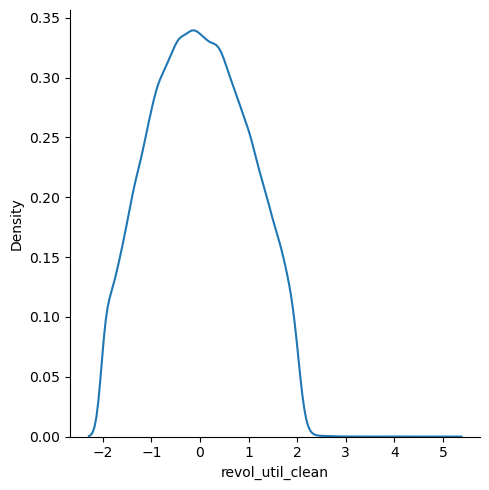

In [50]:
from scipy import stats

z_scores = stats.zscore(df_individual["revol_util_clean"])
sns.displot(z_scores, kind='kde')

The graph above shows me how the standard deviations of my data within the revol_util_clean column are distributed. I can see that they are almost completely normally distributed with some outliers on the right.

In [52]:
for threshold in range(200, 301, 25):
    thresh = threshold/100
    print(f"Threshold == {thresh}, {df_individual[np.abs(z_scores)>thresh].shape[0]} outliers ")

# This will tell me how many outliers within my target feature there are for different thresholds of standard deviations.

Threshold == 2.0, 622 outliers 
Threshold == 2.25, 45 outliers 
Threshold == 2.5, 18 outliers 
Threshold == 2.75, 9 outliers 
Threshold == 3.0, 7 outliers 


I can see that there are only 622 outliers at the 2.0 standard deviation threshold, out of 92,834 records, and even less for subsequent thresholds. This is less than 1% (~0.67%), I will be capping these outliers using the IQR method (1.5 * IQR).

In [54]:
q1 = df_individual['revol_util_clean'].quantile(0.25)
q3 = df_individual['revol_util_clean'].quantile(0.75)
iqr = q3 - q1
# I have calculated the 25th percentile, 75th percentile and inter-quantile range (iqr)

In [55]:
print(round(q1, 2), round(q3, 2), round(iqr, 2))
# I have rounded the values for q1, q3, and IQR for simplicity.

0.3 0.68 0.38


In [56]:
upper_limit = q3 + (1.5 * iqr)
lower_limit = q1 - (1.5 * iqr)
round(lower_limit, 2), round(upper_limit, 2)

(-0.27, 1.25)

<Axes: ylabel='revol_util_clean'>

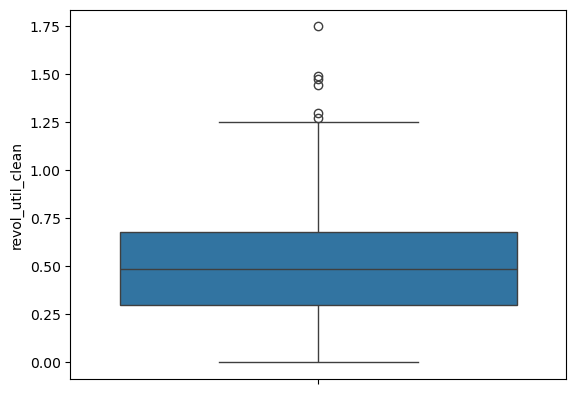

In [57]:
sns.boxplot(df_individual['revol_util_clean'])

I can see that there some outliers to the right (top) of my boxplot. I will impute these outliers to be capped at the upper limit. I will also cap outliers to the left at the lower (bottom) limit, even though there aren't any for consistency.

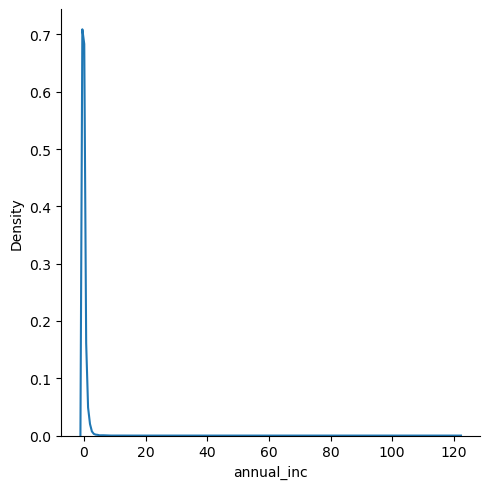

In [59]:
z_scores_1 = stats.zscore(df_individual["annual_inc"])
sns.displot(z_scores_1, kind='kde')

Threshold == 2.0, 1158 outliers 
Threshold == 2.25, 963 outliers 
Threshold == 2.5, 678 outliers 
Threshold == 2.75, 595 outliers 
Threshold == 3.0, 544 outliers 
48000.0 96295.0 48295.0


<Axes: ylabel='annual_inc'>

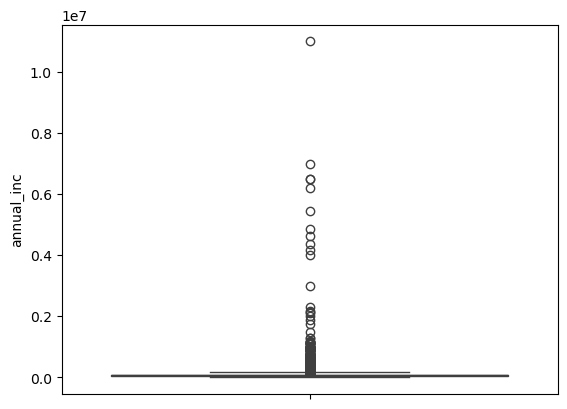

In [60]:
for threshold in range(200, 301, 25):
    thresh = threshold/100
    print(f"Threshold == {thresh}, {df_individual[np.abs(z_scores_1)>thresh].shape[0]} outliers ")
q1_1 = df_individual['annual_inc'].quantile(0.25)
q3_1 = df_individual['annual_inc'].quantile(0.75)
iqr_1 = q3_1 - q1_1
print(round(q1_1, 2), round(q3_1, 2), round(iqr_1, 2))
upper_limit_1 = q3_1 + (1.5 * iqr_1)
lower_limit_1 = q1_1 - (1.5 * iqr_1)
round(lower_limit_1, 2), round(upper_limit_1, 2)
sns.boxplot(df_individual['annual_inc'])

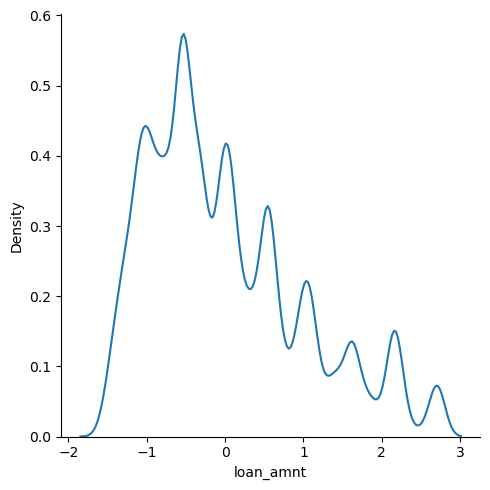

In [61]:
z_scores_2 = stats.zscore(df_individual["loan_amnt"])
sns.displot(z_scores_2, kind='kde')

Threshold == 2.0, 5699 outliers 
Threshold == 2.25, 2181 outliers 
Threshold == 2.5, 1760 outliers 
Threshold == 2.75, 0 outliers 
Threshold == 3.0, 0 outliers 
8000.0 20000.0 12000.0


<Axes: ylabel='loan_amnt'>

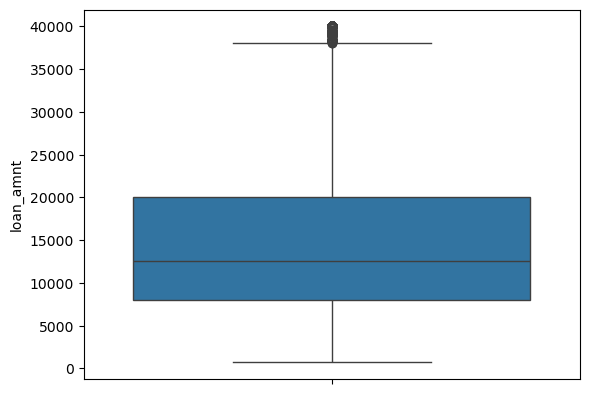

In [62]:
for threshold in range(200, 301, 25):
    thresh = threshold/100
    print(f"Threshold == {thresh}, {df_individual[np.abs(z_scores_2)>thresh].shape[0]} outliers ")
q1_2 = df_individual['loan_amnt'].quantile(0.25)
q3_2 = df_individual['loan_amnt'].quantile(0.75)
iqr_2 = q3_2 - q1_2
print(round(q1_2, 2), round(q3_2, 2), round(iqr_2, 2))
upper_limit_2 = q3_2 + (1.5 * iqr_2)
lower_limit_2 = q1_2 - (1.5 * iqr_2)
round(lower_limit_2, 2), round(upper_limit_2, 2)
sns.boxplot(df_individual['loan_amnt'])

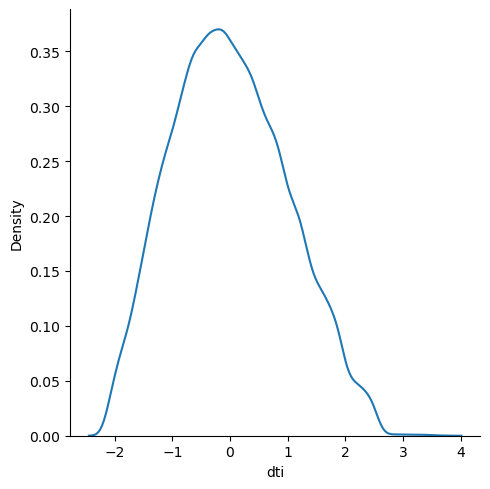

In [63]:
z_scores_3 = stats.zscore(df_individual["dti"])
sns.displot(z_scores_3, kind='kde')

Threshold == 2.0, 2902 outliers 
Threshold == 2.25, 1193 outliers 
Threshold == 2.5, 275 outliers 
Threshold == 2.75, 80 outliers 
Threshold == 3.0, 52 outliers 
11.89 24.29 12.4


<Axes: ylabel='dti'>

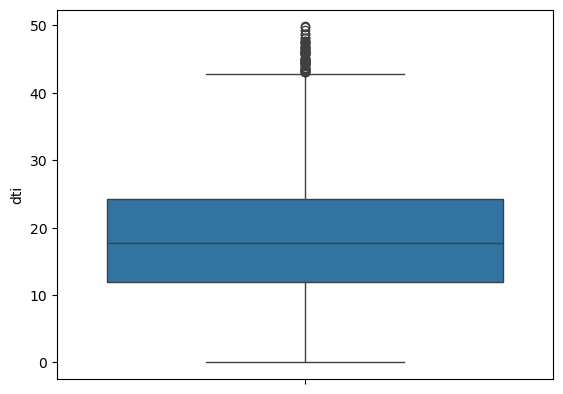

In [64]:
for threshold in range(200, 301, 25):
    thresh = threshold/100
    print(f"Threshold == {thresh}, {df_individual[np.abs(z_scores_3)>thresh].shape[0]} outliers ")
q1_3 = df_individual['dti'].quantile(0.25)
q3_3 = df_individual['dti'].quantile(0.75)
iqr_3 = q3_3 - q1_3
print(round(q1_3, 2), round(q3_3, 2), round(iqr_3, 2))
upper_limit_3 = q3_3 + (1.5 * iqr_3)
lower_limit_3 = q1_3 - (1.5 * iqr_3)
round(lower_limit_3, 2), round(upper_limit_3, 2)
sns.boxplot(df_individual['dti'])

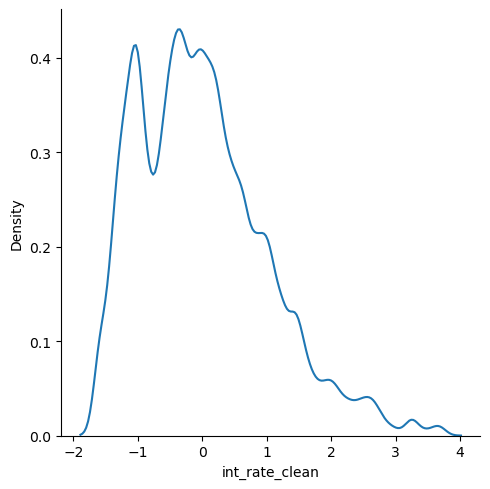

In [65]:
z_scores_4 = stats.zscore(df_individual["int_rate_clean"])
sns.displot(z_scores_4, kind='kde')

Threshold == 2.0, 4055 outliers 
Threshold == 2.25, 2920 outliers 
Threshold == 2.5, 1953 outliers 
Threshold == 2.75, 1011 outliers 
Threshold == 3.0, 753 outliers 
0.09 0.16 0.07


<Axes: ylabel='int_rate_clean'>

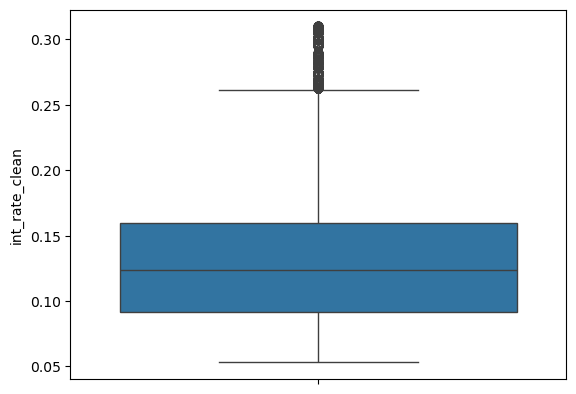

In [66]:
for threshold in range(200, 301, 25):
    thresh = threshold/100
    print(f"Threshold == {thresh}, {df_individual[np.abs(z_scores_4)>thresh].shape[0]} outliers ")
q1_4 = df_individual['int_rate_clean'].quantile(0.25)
q3_4 = df_individual['int_rate_clean'].quantile(0.75)
iqr_4 = q3_4 - q1_4
print(round(q1_4, 2), round(q3_4, 2), round(iqr_4, 2))
upper_limit_4 = q3_4 + (1.5 * iqr_4)
lower_limit_4 = q1_4 - (1.5 * iqr_4)
round(lower_limit_4, 2), round(upper_limit_4, 2)
sns.boxplot(df_individual['int_rate_clean'])

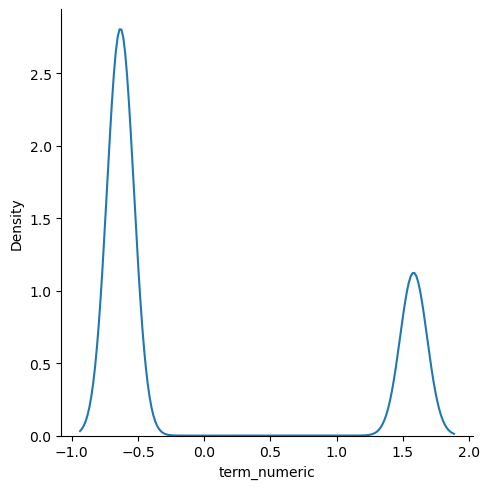

In [67]:
z_scores_5 = stats.zscore(df_individual["term_numeric"])
sns.displot(z_scores_5, kind='kde')

Threshold == 2.0, 0 outliers 
Threshold == 2.25, 0 outliers 
Threshold == 2.5, 0 outliers 
Threshold == 2.75, 0 outliers 
Threshold == 3.0, 0 outliers 
36.0 60.0 24.0


<Axes: xlabel='term_numeric', ylabel='Density'>

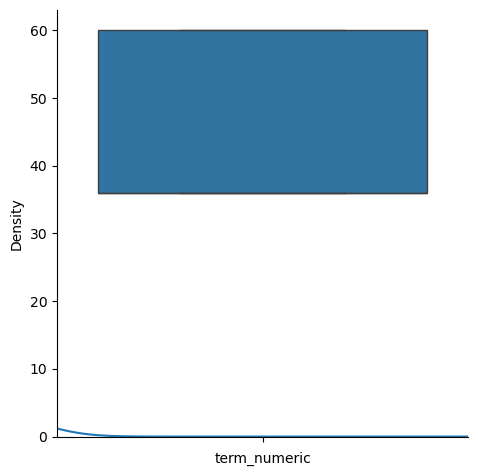

In [68]:
z_scores_5 = stats.zscore(df_individual["term_numeric"])
sns.displot(z_scores_5, kind='kde')
for threshold in range(200, 301, 25):
    thresh = threshold/100
    print(f"Threshold == {thresh}, {df_individual[np.abs(z_scores_5)>thresh].shape[0]} outliers ")
q1_5 = df_individual['term_numeric'].quantile(0.25)
q3_5 = df_individual['term_numeric'].quantile(0.75)
iqr_5 = q3_5 - q1_5
print(round(q1_5, 2), round(q3_5, 2), round(iqr_5, 2))
upper_limit_5 = q3_5 + (1.5 * iqr_5)
lower_limit_5 = q1_5 - (1.5 * iqr_5)
round(lower_limit_5, 2), round(upper_limit_5, 2)
sns.boxplot(df_individual['term_numeric'])

In [69]:
# I am going to denote a new dataframe for simplicity by copying the dataframe, df_dropped_individual
df_clean = df_individual.copy()
df_clean.loc[(df_clean['revol_util_clean']>upper_limit), 'revol_util_clean'] = upper_limit
df_clean.loc[(df_clean['revol_util_clean']<lower_limit), 'revol_util_clean'] = lower_limit
# I have capped outliers to the lower and upper limit defined previously

<Axes: ylabel='revol_util_clean'>

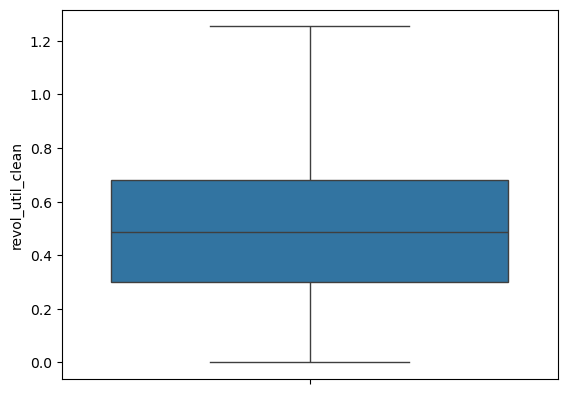

In [70]:
sns.boxplot(df_clean['revol_util_clean'])

I can see the outliers have been successfully capped at 1.5 times the IQR.

<Axes: ylabel='annual_inc'>

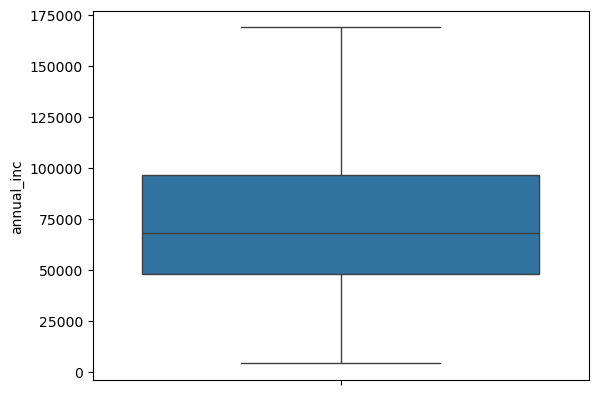

In [72]:
df_clean.loc[(df_clean['annual_inc']>upper_limit_1), 'annual_inc'] = upper_limit_1
df_clean.loc[(df_clean['annual_inc']<lower_limit_1), 'annual_inc'] = lower_limit_1
sns.boxplot(df_clean['annual_inc'])

<Axes: ylabel='loan_amnt'>

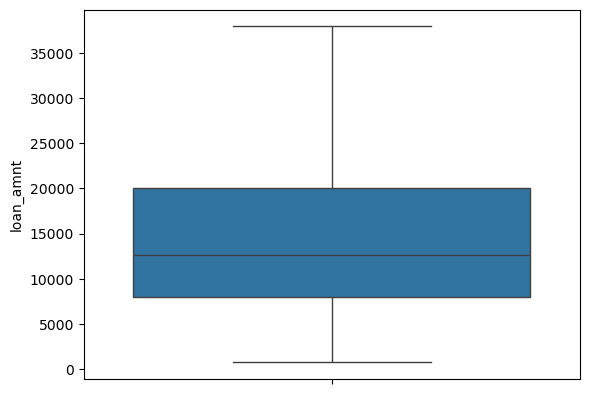

In [73]:
df_clean.loc[(df_clean['loan_amnt']>upper_limit_2), 'loan_amnt'] = upper_limit_2
df_clean.loc[(df_clean['loan_amnt']<lower_limit_2), 'loan_amnt'] = lower_limit_2
sns.boxplot(df_clean['loan_amnt'])

<Axes: ylabel='dti'>

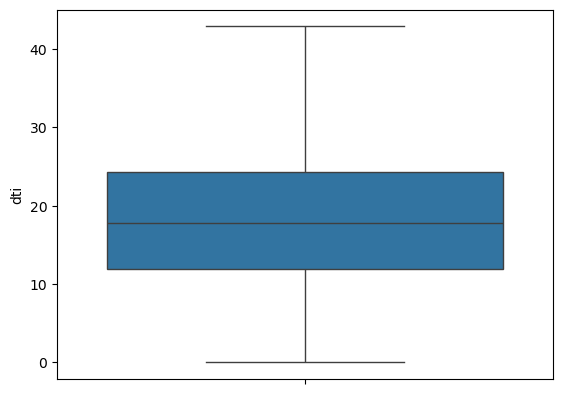

In [74]:
df_clean.loc[(df_clean['dti']>upper_limit_3), 'dti'] = upper_limit_3
df_clean.loc[(df_clean['dti']<lower_limit_3), 'dti'] = lower_limit_3
sns.boxplot(df_clean['dti'])

<Axes: ylabel='int_rate_clean'>

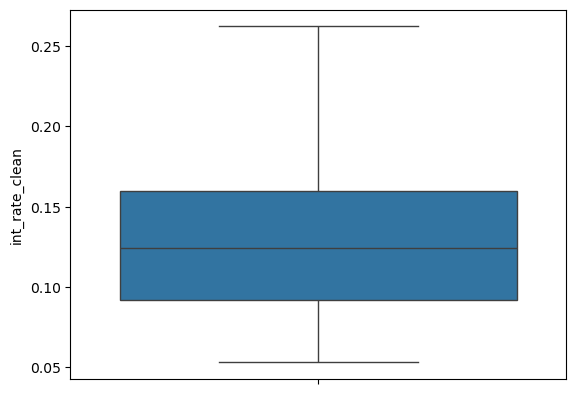

In [75]:
df_clean.loc[(df_clean['int_rate_clean']>upper_limit_4), 'int_rate_clean'] = upper_limit_4
df_clean.loc[(df_clean['int_rate_clean']<lower_limit_4), 'int_rate_clean'] = lower_limit_4
sns.boxplot(df_clean['int_rate_clean'])

<Axes: ylabel='term_numeric'>

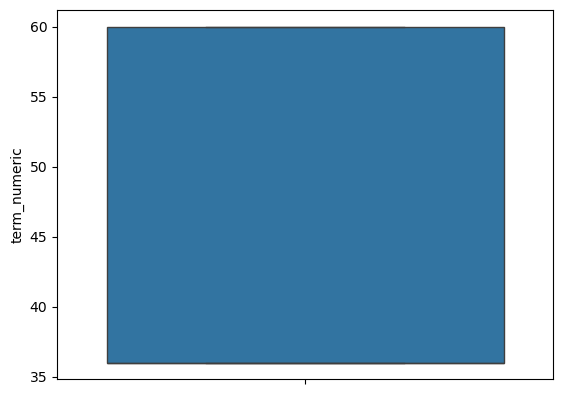

In [76]:
df_clean.loc[(df_clean['term_numeric']>upper_limit_5), 'term_numeric'] = upper_limit_5
df_clean.loc[(df_clean['term_numeric']<lower_limit_5), 'term_numeric'] = lower_limit_5
sns.boxplot(df_clean['term_numeric'])

Now I am going to create a new feature. This feature will grade the customers' utilisation rates, based on general intervals. I will assume SME's provided the following intervals underscored by a consensus in the banking sector:
- Utilisation rate =< 30% = Low Utilisation;
- 30% < Utilisation rate =< 60% = Moderate Utilisation;
- 60% < Utilisation rate =< 90% = High Utilisation;
- Utilisation rate > 90% = Very High Utilisation.

In [78]:
from pandas import Series, DataFrame

df_clean['revol_util_cat'] = pd.cut(df_clean['revol_util_clean'],
      bins=[-1, 0.3, 0.6, 0.9, 2],
      labels=['Low Utilisation', 'Moderate Utilisation', 'High Utilisation', 'Very High Utilisation'])

In [79]:
df_clean.loc[:,['revol_util_clean', 'revol_util_cat']].head(100)

,revol_util_clean,revol_util_cat
0,0.83,High Utilisation
1,0.65,High Utilisation
2,0.53,Moderate Utilisation
3,0.12,Low Utilisation
4,0.27,Low Utilisation
5,0.39,Moderate Utilisation
6,0.22,Low Utilisation
7,0.82,High Utilisation
8,0.12,Low Utilisation
9,0.16,Low Utilisation


In [80]:
df_clean['revol_util_cat']

0             High Utilisation
1             High Utilisation
2         Moderate Utilisation
3              Low Utilisation
4              Low Utilisation
5         Moderate Utilisation
6              Low Utilisation
7             High Utilisation
8              Low Utilisation
9              Low Utilisation
11            High Utilisation
12        Moderate Utilisation
13             Low Utilisation
14             Low Utilisation
15            High Utilisation
16             Low Utilisation
17        Moderate Utilisation
18            High Utilisation
19            High Utilisation
20            High Utilisation
21            High Utilisation
22             Low Utilisation
23        Moderate Utilisation
24        Moderate Utilisation
25        Moderate Utilisation
26             Low Utilisation
27             Low Utilisation
28            High Utilisation
29            High Utilisation
30            High Utilisation
31       Very High Utilisation
32            High Utilisation
33      

In [81]:
df_clean.revol_util_cat.value_counts()

revol_util_cat
Moderate Utilisation     37042
High Utilisation         27541
Low Utilisation          23396
Very High Utilisation     4855
Name: count, dtype: int64

Using the few lines of code above I have categorised the revolving credit utilisation rates into the categories mentioned previously. After reading the underlying settings of the pd.cut() operator, I know it assumes the right boundary as inclusive and infers from the data that my categories are ordered.

Now I am going to investigate which types of loans customers with 'High' and 'Very High' utilisation rates take out. This will help me understand what loans are opening the bank up to increased exposure compared to others.

In [84]:
df_clean.head(50)

,id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,url,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,fico_range_low,fico_range_high,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,last_fico_range_high,last_fico_range_low,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_act_il,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit,revol_bal_joint,sec_app_fico_range_low,sec_app_fico_range_high,sec_app_earliest_cr_line,sec_app_inq_last_6mths,sec_app_mort_acc,sec_app_open_acc,sec_app_revol_util,sec_app_open_act_il,sec_app_num_rev_accts,sec_app_chargeoff_within_12_mths,sec_app_collections_12_mths_ex_med,hardship_flag,hardship_type,hardship_reason,hardship_status,deferral_term,hardship_amount,hardship_start_date,hardship_end_date,payment_plan_start_date,hardship_length,hardship_dpd,hardship_loan_status,orig_projected_additional_accrued_interest,hardship_payoff_balance_amount,hardship_last_payment_amount,debt_settlement_flag,revol_util_clean,int_rate_clean,loan_default,grade_encoded,term_numeric,revol_util_cat
0,167338079,4000.00,4000.00,4000.00,36 months,13.08%,134.93,B,B5,cashier,10+ years,MORTGAGE,48000.00,Source Verified,Mar-2020,Current,https://lendingclub.com/browse/loanDetail.acti...,home_improvement,Home improvement,115xx,NY,20.25,1.00,Dec-2004,665.00,669.00,0.00,19.00,110.00,4.00,1.00,1988.00,82.8%,12.00,w,3816.34,3816.34,266.95,266.95,183.66,83.29,0.00,0.00,0.00,May-2020,134.93,Jun-2020,May-2020,669.00,665.00,1.00,NaN,1.00,Individual,NaN,NaN,NaN,0.00,3832.00,259024.00,0.00,1.00,0.00,1.00,16.00,9960.00,56.00,0.00,0.00,0.00,59.00,2400.00,1.00,0.00,0.00,1.00,64756.00,NaN,NaN,0.00,0.00,179.00,75.00,38.00,16.00,2.00,NaN,19.00,16.00,19.00,1.00,0.00,2.00,0.00,1.00,5.00,2.00,5.00,2.00,4.00,0.00,0.00,0.00,0.00,75.00,NaN,1.00,0.00,395328.00,11948.00,0.00,17928.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,0.83,0.13,False,1,36.00,High Utilisation
1,71016917,24000.00,24000.00,24000.00,60 months,9.16%,500.07,B,B2,ABM,6 years,RENT,57000.00,Source Verified,Feb-2016,Current,https://lendingclub.com/browse/loanDetail.acti...,credit_card,Credit card refinancing,708xx,LA,25.33,0.00,Jan-2004,680.00,684.00,0.00,NaN,NaN,10.00,0.00,22697.00,64.5%,24.00,w,4333.29,4333.29,25496.16,25496.16,19666.71,5829.45,0.00,0.00,0.00,May-2020,500.07,Jun-2020,May-2020,704.00,700.00,0.00,NaN,1.00,Individual,NaN,NaN,NaN,0.00,0.00,61815.00,0.00,3.00,0.00,3.00,14.00,39118.00,72.00,1.00,1.00,2137.00,67.00,35200.00,0.00,7.00,0.00,4.00,6182.00,7741.00,40.50,0.00,0.00,145.00,137.00,7.00,7.00,0.00,7.00,NaN,24.00,NaN,0.00,3.00,5.00,5.00,6.00,15.00,7.00,9.00,5.00,10.00,0.00,0.00,0.00,1.00,95.80,60.00,0.00,0.00,88154.00,61815.00,13000.00,52954

In [85]:
df_clean.purpose.value_counts()

purpose
debt_consolidation    51542
credit_card           22592
home_improvement       6016
other                  5643
major_purchase         2060
medical                1080
small_business          968
car                     897
house                   651
vacation                641
moving                  589
wedding                  87
renewable_energy         51
educational              17
Name: count, dtype: int64

# Visualisation

Create a stacked bar plot of loan purposes for high and very high credit utilisation.

C:\Users\rubel\AppData\Local\Temp\ipykernel_5204\283102379.py:5: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  plot_data = pd.pivot_table(


<Figure size 10000x5000 with 0 Axes>

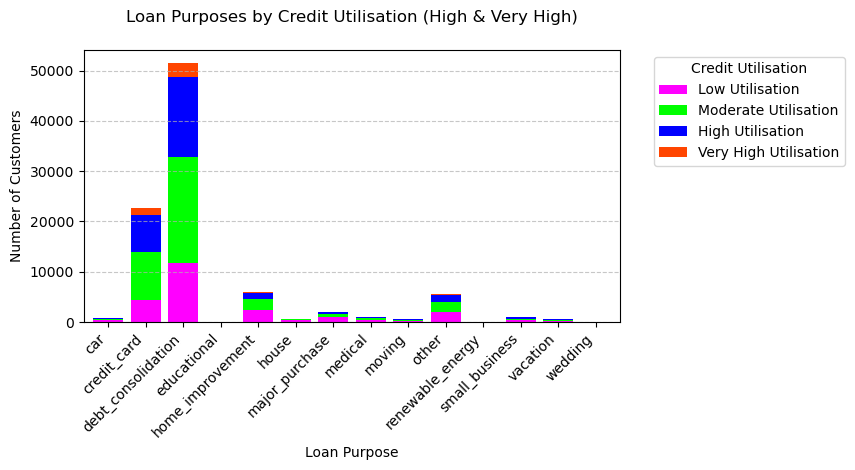

In [87]:
# Filter for only High and Very High utilization
high_risk_customs = df_clean[df_clean['revol_util_cat'].isin(['Low Utilisation', 'Moderate Utilisation', 'High Utilisation', 'Very High Utilisation'])]

# Create pivot table for plotting
plot_data = pd.pivot_table(
    high_risk_customs,
    index='purpose',
    columns='revol_util_cat',
    aggfunc='size',
    fill_value=0
)

# Create figure and axis with larger size
plt.figure(figsize=(100, 50))

# Create stacked bar plot
plot_data.plot(
    kind='bar',
    stacked=True,
    color=['#FF00FF', '#00FF00', '#0000FF', '#FF4500'],
    width=0.8
)

# Customize the plot
plt.title('Loan Purposes by Credit Utilisation (High & Very High)', pad=20)
plt.xlabel('Loan Purpose')
plt.ylabel('Number of Customers')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha='right')

# Add grid lines
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Adjust layout to prevent label cutoff
plt.tight_layout()

# Add legend with better positioning
plt.legend(title='Credit Utilisation', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.show()

In [88]:
results = df_clean.loc[(df_clean.loan_status == 'Charged Off')]
results.head(10)

,id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,url,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,fico_range_low,fico_range_high,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,last_fico_range_high,last_fico_range_low,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_act_il,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit,revol_bal_joint,sec_app_fico_range_low,sec_app_fico_range_high,sec_app_earliest_cr_line,sec_app_inq_last_6mths,sec_app_mort_acc,sec_app_open_acc,sec_app_revol_util,sec_app_open_act_il,sec_app_num_rev_accts,sec_app_chargeoff_within_12_mths,sec_app_collections_12_mths_ex_med,hardship_flag,hardship_type,hardship_reason,hardship_status,deferral_term,hardship_amount,hardship_start_date,hardship_end_date,payment_plan_start_date,hardship_length,hardship_dpd,hardship_loan_status,orig_projected_additional_accrued_interest,hardship_payoff_balance_amount,hardship_last_payment_amount,debt_settlement_flag,revol_util_clean,int_rate_clean,loan_default,grade_encoded,term_numeric,revol_util_cat
5,65735255,4000.00,4000.00,4000.00,36 months,11.49%,131.89,B,B5,CSR,10+ years,RENT,46000.00,Verified,Nov-2015,Charged Off,https://lendingclub.com/browse/loanDetail.acti...,moving,Moving and relocation,940xx,CA,11.56,0.00,Jul-2004,700.00,704.00,0.00,NaN,97.00,4.00,1.00,3556.00,38.7%,7.00,w,0.00,0.00,3930.31,3930.31,3111.33,694.33,0.00,124.65,22.44,Apr-2018,131.89,NaN,Oct-2018,504.00,500.00,0.00,NaN,1.00,Individual,NaN,NaN,NaN,0.00,0.00,16847.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9200.00,NaN,NaN,NaN,1.00,4212.00,4381.00,43.10,0.00,0.00,136.00,125.00,13.00,13.00,0.00,13.00,NaN,13.00,NaN,0.00,2.00,3.00,2.00,4.00,2.00,3.00,5.00,3.00,4.00,0.00,0.00,0.00,0.00,100.00,0.00,1.00,0.00,28077.00,16847.00,7700.00,18877.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,0.39,0.11,True,1,36.00,Moderate Utilisation
12,133323116,20000.00,20000.00,20000.00,36 months,10.56%,650.62,B,B3,Analyst,10+ years,RENT,86000.00,Source Verified,May-2018,Charged Off,https://lendingclub.com/browse/loanDetail.acti...,debt_consolidation,Debt consolidation,948xx,CA,8.76,0.00,Aug-2003,680.00,684.00,0.00,70.00,59.00,13.00,1.00,10368.00,32.6%,37.00,w,0.00,0.00,5826.25,5826.25,4425.07,1401.18,0.00,0.00,0.00,Feb-2019,650.62,NaN,Nov-2019,499.00,0.00,0.00,70.00,1.00,Individual,NaN,NaN,NaN,0.00,0.00,36108.00,0.00,4.00,1.00,3.00,9.00,25740.00,97.00,2.00,5.00,8216.00,62.00,31800.00,1.00,0.00,2.00,8.00,2778.00,12618.00,44.90,0.00,0.00,115.00,177.00,7.00,7.00,2.00,8.00,NaN,8.00,NaN,1.00,3.00,5.00,5.00,11.00,7.00,9.00,28.00,5.00,13.00,0.00,0.00,0.00,3.00,97.00,40.00,1.00,0.00,58486.00,36108.00,22900.00,26686.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Na

I located all the default records using the df.loc code. I did this to try and find any patterns based on face value. This would speed up the process of picking features rather than going through numerous iterations of which combination of features showcase better predictive power.

In [90]:
df_clean.home_ownership.value_counts()

home_ownership
MORTGAGE    44335
RENT        37753
OWN         10605
ANY           125
OTHER          12
NONE            4
Name: count, dtype: int64

In [91]:
df_clean['home_ownership_numeric'] = df_clean['home_ownership']
df_clean['home_ownership_numeric'].replace(['OTHER', 'ANY', 'NONE', 'OWN', 'RENT', 'MORTGAGE'],
                        [1, 1, 1, 2, 3, 4], inplace=True)
df_clean.head(10)

C:\Users\rubel\AppData\Local\Temp\ipykernel_5204\2718120410.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_clean['home_ownership_numeric'].replace(['OTHER', 'ANY', 'NONE', 'OWN', 'RENT', 'MORTGAGE'],
C:\Users\rubel\AppData\Local\Temp\ipykernel_5204\2718120410.py:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_dow

,id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,url,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,fico_range_low,fico_range_high,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,last_fico_range_high,last_fico_range_low,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_act_il,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit,revol_bal_joint,sec_app_fico_range_low,sec_app_fico_range_high,sec_app_earliest_cr_line,sec_app_inq_last_6mths,sec_app_mort_acc,sec_app_open_acc,sec_app_revol_util,sec_app_open_act_il,sec_app_num_rev_accts,sec_app_chargeoff_within_12_mths,sec_app_collections_12_mths_ex_med,hardship_flag,hardship_type,hardship_reason,hardship_status,deferral_term,hardship_amount,hardship_start_date,hardship_end_date,payment_plan_start_date,hardship_length,hardship_dpd,hardship_loan_status,orig_projected_additional_accrued_interest,hardship_payoff_balance_amount,hardship_last_payment_amount,debt_settlement_flag,revol_util_clean,int_rate_clean,loan_default,grade_encoded,term_numeric,revol_util_cat,home_ownership_numeric
0,167338079,4000.00,4000.00,4000.00,36 months,13.08%,134.93,B,B5,cashier,10+ years,MORTGAGE,48000.00,Source Verified,Mar-2020,Current,https://lendingclub.com/browse/loanDetail.acti...,home_improvement,Home improvement,115xx,NY,20.25,1.00,Dec-2004,665.00,669.00,0.00,19.00,110.00,4.00,1.00,1988.00,82.8%,12.00,w,3816.34,3816.34,266.95,266.95,183.66,83.29,0.00,0.00,0.00,May-2020,134.93,Jun-2020,May-2020,669.00,665.00,1.00,NaN,1.00,Individual,NaN,NaN,NaN,0.00,3832.00,259024.00,0.00,1.00,0.00,1.00,16.00,9960.00,56.00,0.00,0.00,0.00,59.00,2400.00,1.00,0.00,0.00,1.00,64756.00,NaN,NaN,0.00,0.00,179.00,75.00,38.00,16.00,2.00,NaN,19.00,16.00,19.00,1.00,0.00,2.00,0.00,1.00,5.00,2.00,5.00,2.00,4.00,0.00,0.00,0.00,0.00,75.00,NaN,1.00,0.00,395328.00,11948.00,0.00,17928.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,0.83,0.13,False,1,36.00,High Utilisation,4
1,71016917,24000.00,24000.00,24000.00,60 months,9.16%,500.07,B,B2,ABM,6 years,RENT,57000.00,Source Verified,Feb-2016,Current,https://lendingclub.com/browse/loanDetail.acti...,credit_card,Credit card refinancing,708xx,LA,25.33,0.00,Jan-2004,680.00,684.00,0.00,NaN,NaN,10.00,0.00,22697.00,64.5%,24.00,w,4333.29,4333.29,25496.16,25496.16,19666.71,5829.45,0.00,0.00,0.00,May-2020,500.07,Jun-2020,May-2020,704.00,700.00,0.00,NaN,1.00,Individual,NaN,NaN,NaN,0.00,0.00,61815.00,0.00,3.00,0.00,3.00,14.00,39118.00,72.00,1.00,1.00,2137.00,67.00,35200.00,0.00,7.00,0.00,4.00,6182.00,7741.00,40.50,0.00,0.00,145.00,137.00,7.00,7.00,0.00,7.00,NaN,24.00,NaN,0.00,3.00,5.00,5.00,6.00,15.00,7.00,9.00,5.00,10.00,0.00,0.00,0.00,1.00,95.80,60.00,0.00,0.00,88154.0

In [92]:
df_clean.loc[(df_clean['home_ownership'] == 'OTHER') | (df_clean['home_ownership'] == 'ANY') | (df_clean['home_ownership'] == 'NONE')]

,id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,url,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,fico_range_low,fico_range_high,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,last_fico_range_high,last_fico_range_low,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_act_il,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit,revol_bal_joint,sec_app_fico_range_low,sec_app_fico_range_high,sec_app_earliest_cr_line,sec_app_inq_last_6mths,sec_app_mort_acc,sec_app_open_acc,sec_app_revol_util,sec_app_open_act_il,sec_app_num_rev_accts,sec_app_chargeoff_within_12_mths,sec_app_collections_12_mths_ex_med,hardship_flag,hardship_type,hardship_reason,hardship_status,deferral_term,hardship_amount,hardship_start_date,hardship_end_date,payment_plan_start_date,hardship_length,hardship_dpd,hardship_loan_status,orig_projected_additional_accrued_interest,hardship_payoff_balance_amount,hardship_last_payment_amount,debt_settlement_flag,revol_util_clean,int_rate_clean,loan_default,grade_encoded,term_numeric,revol_util_cat,home_ownership_numeric
1958,144830500,10000.00,10000.00,10000.00,36 months,10.33%,324.23,B,B1,Compliance officer,10+ years,ANY,100008.00,Source Verified,Dec-2018,Current,https://lendingclub.com/browse/loanDetail.acti...,debt_consolidation,Debt consolidation,085xx,NJ,21.25,1.00,Jul-2007,670.00,674.00,2.00,12.00,74.00,22.00,1.00,5642.00,21.3%,30.00,w,5668.84,5668.84,5506.17,5506.17,4331.16,1175.01,0.00,0.00,0.00,May-2020,324.23,Jun-2020,May-2020,619.00,615.00,0.00,12.00,1.00,Individual,NaN,NaN,NaN,0.00,0.00,77108.00,1.00,5.00,1.00,2.00,3.00,71466.00,82.00,2.00,3.00,2927.00,68.00,26500.00,2.00,0.00,3.00,5.00,3505.00,15257.00,20.10,1.00,0.00,137.00,132.00,7.00,3.00,0.00,33.00,NaN,0.00,NaN,1.00,7.00,9.00,10.00,12.00,10.00,17.00,20.00,9.00,22.00,0.00,0.00,1.00,3.00,96.70,10.00,1.00,0.00,113740.00,77108.00,19100.00,87240.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,0.21,0.10,False,1,36.00,Low Utilisation,1
2004,140223026,3000.00,3000.00,3000.00,36 months,8.46%,94.65,A,A5,NaN,NaN,ANY,20376.00,Not Verified,Sep-2018,Fully Paid,https://lendingclub.com/browse/loanDetail.acti...,debt_consolidation,Debt consolidation,325xx,FL,25.97,0.00,Feb-2004,720.00,724.00,0.00,NaN,108.00,5.00,1.00,3857.00,19.4%,14.00,w,0.00,0.00,3088.82,3088.82,3000.00,88.82,0.00,0.00,0.00,Jan-2019,2807.69,NaN,May-2020,764.00,760.00,0.00,NaN,1.00,Individual,NaN,NaN,NaN,0.00,0.00,6189.00,0.00,1.00,0.00,0.00,30.00,2332.00,27.00,0.00,0.00,1310.00,22.00,19900.00,0.00,0.00,0.00,0.00,1238.00,9609.00,19.90,0.00,0.00,175.00,59.00,35.00,30.00,0.00,35.00,NaN,NaN,NaN,0.00,2.00,4.00,2.00,2.00,9.00,4.00,5.00,4.00,5.00,0.00,0.00,0.00,0.00,100.00,0.00,1

In [93]:
df_clean['home_ownership_numeric']
# to check the code hasn't interpreted the transformation as ordinal.

0        4
1        3
2        4
3        4
4        4
5        3
6        4
7        3
8        4
9        3
11       3
12       3
13       3
14       4
15       4
16       3
17       4
18       4
19       4
20       3
21       4
22       3
23       2
24       4
25       4
26       4
27       4
28       3
29       3
30       3
31       4
32       4
33       4
34       2
35       3
36       4
37       4
38       2
39       4
40       3
41       3
42       3
43       4
44       3
45       2
46       2
47       2
49       2
50       3
51       4
52       4
53       3
54       3
55       3
56       3
57       4
58       3
59       4
60       3
61       4
62       3
63       4
64       2
65       3
66       4
67       3
68       4
69       3
70       4
71       2
72       3
73       4
74       3
75       4
76       3
77       4
78       4
79       4
82       3
83       4
84       3
85       4
87       3
88       3
89       4
90       3
91       2
92       4
93       4
94       3
95       3

In [94]:
df_clean.home_ownership_numeric.value_counts()

home_ownership_numeric
4    44335
3    37753
2    10605
1      141
Name: count, dtype: int64

As you can see from the lines of code above, I decided that home_ownership looked quite interesting. Hence, why I created a numeric version of the column. For simplicity I included 'OTHER', 'ANY', and 'NONE', into the same category (1). The last line of code was to double check no records had been lost in the process.

# Summary Statistics

Now that the outliers within our control features have been dealt with, I will check the summary stats.

In [97]:
df_clean.describe()

,id,loan_amnt,funded_amnt,funded_amnt_inv,installment,annual_inc,dti,delinq_2yrs,fico_range_low,fico_range_high,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,last_fico_range_high,last_fico_range_low,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,annual_inc_joint,dti_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_act_il,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit,revol_bal_joint,sec_app_fico_range_low,sec_app_fico_range_high,sec_app_inq_last_6mths,sec_app_mort_acc,sec_app_open_acc,sec_app_revol_util,sec_app_open_act_il,sec_app_num_rev_accts,sec_app_chargeoff_within_12_mths,sec_app_collections_12_mths_ex_med,deferral_term,hardship_amount,hardship_length,hardship_dpd,orig_projected_additional_accrued_interest,hardship_payoff_balance_amount,hardship_last_payment_amount,revol_util_clean,int_rate_clean,grade_encoded,term_numeric,home_ownership_numeric
count,92834.00,92834.00,92834.00,92834.00,92834.00,92834.00,92834.00,92834.00,92834.00,92834.00,92834.00,44205.00,13757.00,92834.00,92834.00,92834.00,92834.00,92834.00,92834.00,92834.00,92834.00,92834.00,92834.00,92834.00,92834.00,92834.00,92834.00,92834.00,92834.00,92828.00,23230.00,92834.00,0.00,0.00,92834.00,90396.00,90396.00,63205.00,63205.00,63205.00,63205.00,61316.00,63205.00,54331.00,63205.00,63205.00,63205.00,63199.00,90396.00,63205.00,63205.00,63205.00,91056.00,90395.00,90163.00,90118.00,92828.00,92834.00,87701.00,90396.00,90396.00,90396.00,91056.00,90217.00,20647.00,80969.00,29785.00,90396.00,90396.00,90396.00,90783.00,90396.00,90396.00,90396.00,90396.00,90396.00,90783.00,87322.00,90396.00,90396.00,90396.00,90392.00,90144.00,92789.00,92829.00,90396.00,91056.00,91056.00,90396.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,4160.00,5286.00,4160.00,4160.00,5196.00,5286.00,5286.00,92834.00,92834.00,92834.00,92834.00,92834.00
mean,94756677.95,14927.57,14959.71,14943.89,442.44,76405.29,18.26,0.29,699.52,703.52,0.57,34.96,74.35,11.73,0.18,16876.97,24.14,3586.07,3585.54,12603.05,12587.18,9979.01,2451.84,1.72,170.49,29.14,3525.05,689.08,675.98,0.02,44.53,1.00,NaN,NaN,0.00,213.38,142614.06,0.94,2.84,0.70,1.62,20.27,36439.68,69.04,1.28,2.70,5980.23,56.22,36214.78,1.07,1.47,2.00,4.54,13353.56,12633.94,56.17,0.01,11.17,125.60,179.57,14.22,8.26,1.49,24.72,39.32,7.07,36.16,0.49,3.74,5.65,4.90,7.73,8.56,8.32,13.91,5.60,11.74,0.00,0.00,0.08,2.10,94.31,40.33,0.12,0.04,179921.76,52329.14,24732.54,44924.41,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.23,117.34,2.23,2.32,353.54,11410.94,708.88,0.49,0.13,1.56,42.86,3.36
std,51449874.74,9148.79,9243.48,9246.89,267.31,38273.05,8.51,0.83,33.02,33.02,0.87,21.92,26.63,5.76,0.56,22468.33,12.08,6986.71,6986.16,10316.71,10312.95,8617.54,2762.42,13.36,816.86,145.06,6097.87,75.30,116.41,0.15,21.65,0.00,NaN,NaN,0.07,1711.66,162533.49,1.14,3.05,0.94,1.60,25.18,46098.99,23.61,1.51,2.59,5456.86,20.77,35666.33,1.49,2.66,2.34,3.19,16313.86,17872.11,28.69,0.10,713.62,54.50,98.08,17.66,9.11,1.88,31.88,22.57,5.96,22.23,1.36,2.38,3.42,3.13,4.72,7.44,4.79,8.07,3.34,5.76,0.02,0.05,0.46,1.85,8.93,3

In [98]:
df_clean.to_csv(f"{path}/data/2-intermediate/df_out_dsif_capstone_project.csv"
                        , index = False)

# Baseline Model

# Model Development & Feature Selection

In [101]:
features = ['fico_range_high', 'fico_range_low', 'annual_inc', 'dti',
            'int_rate_clean', 'term_numeric', 'revol_util_clean',
            'loan_amnt', 'grade_encoded', 'home_ownership_numeric']

X = df_clean[features]
y = df_clean['loan_default']

I have chosen 10 features to include in my baseline model. Below is my reasoning for each:

fico_range_high - This feature represents the applicants highest credit score. Applicants with higher credit scores are assumed to be safer bets to lend to. This feature could have some beneficial predictive power.

fico_range_low - This feature represents the applicants lowest credit score. Applicants with lower credit scores are assumed to be riskier bets to lend to. 

annual_inc - A person's annual income is a good indicator of whether the individual will be able to afford the payments due on the loan or not. 

dti - Debt to income ratio gives us a good understanding of how well this individual manages their finances. Individuals with higher debt to income ratios can be deemed as riskier to lend to given their existing commitments to other loans.

int_rate_clean - This feature always provides valuable info. with regards to defaults. Risk premiums are usually included in what's charged as interest for riskier loans.

term_numeric - This feature shows the term of each loan. We might be able to interpret defaulters using loan terms. It could be argued that shorter term loans have a higher risk of default because of its purpose, the individuals who take out short term loans etc.

revol_util_clean - I brought this feature over from my first assignment. It is common knowledge that customers with high credit utilisation are usually worse with money management. Therefore, this might be a good indicator for loan defaults.

loan_amnt - This is pretty simple. The greater the loan amount, usually the greater the burden on a customer's finances. This feature would provide us interesting information, particularly when we are controlling for debt-to-income ratios also.

grade_encoded - This is a numeric version of the grade feature. Grade tells us which loans are riskier and which are safer. Always has been a good indicator of defaults.

home_ownership_numeric - This is a numeric version of the home_ownership feature. I chose this feature as well purely because of an oversimplification and assumption; a customer who own's their home is less risky because they are not committed to a monthly outgoing for housing, a customer who rent's is riskier than an owner because they have significant monthly outgoings, but they can move and change this, and a customer with a mortgage is riskiest because they are committed to usually paying a significant amount of their earnings for the mortgage. 'ANY', 'OTHER', and 'NONE' were grouped together because the dictionary provided no definition for them. They were small in count so it shouldn't affect the model significantly.

In [103]:
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(strategy='mean')
X = imputer.fit_transform(X)

In [104]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [105]:
for dframe in [X_train, X_test, y_train, y_test]:
    print(f"Shape: {dframe.shape}")

Shape: (74267, 10)
Shape: (18567, 10)
Shape: (74267,)
Shape: (18567,)


In [107]:
model = LogisticRegression()

In [108]:
model.fit(X_train, y_train)

C:\Users\rubel\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [109]:
predictions = model.predict(X_test)
predictions

array([False, False, False, ..., False, False, False])

The few lines of code above have utilised logistic regression modelling in this instance. I then produced the predictions, and as you can see the model isn't all that good. It looks like all the predictions are False, just like we saw in class. I am going to produce some evaluation metrics below to see what we're actually working with.

In [111]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix

accuracy = accuracy_score(y_test, predictions)
precision = precision_score(y_test, predictions)
recall = recall_score(y_test, predictions)
f1 = f1_score(y_test, predictions)
roc_auc = roc_auc_score(y_test, model.predict_proba(X_test)[:,1])

cm = confusion_matrix(y_test, predictions)

print(f'Accuracy: {accuracy}')
print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'F1-Score: {f1}')
print(f'ROC-AUC: {roc_auc}')
print(f'Confusion Matrix:\n{cm}')

Accuracy: 0.872515753756665
Precision: 0.0
Recall: 0.0
F1-Score: 0.0
ROC-AUC: 0.6528444872135901
Confusion Matrix:
[[16200     0]
 [ 2367     0]]


C:\Users\rubel\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


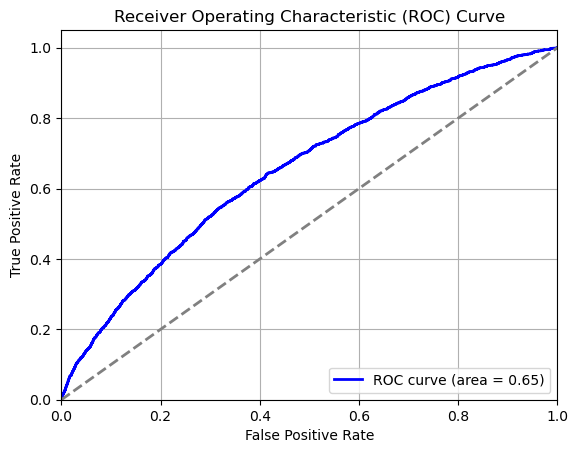

ROC AUC Score: 0.65


In [113]:
y_pred_prob = model.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')  # Diagonal line (random prediction)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.grid()
plt.show()
print(f'ROC AUC Score: {roc_auc_score(y_test, y_pred_prob):.2f}')

Above is just a simple visualisation of the ROC Curve.

# Resampling (Handling Class Imbalance)

In [116]:
from imblearn.over_sampling import SMOTE

smote = SMOTE()
X_resampled, y_resampled = smote.fit_resample(X, y)

In [117]:
y_resampled.head(100)

0     False
1     False
2     False
3     False
4     False
5      True
6     False
7     False
8     False
9     False
10    False
11     True
12    False
13    False
14    False
15    False
16    False
17    False
18    False
19    False
20    False
21    False
22     True
23    False
24     True
25    False
26    False
27    False
28    False
29    False
30    False
31    False
32    False
33    False
34    False
35    False
36    False
37    False
38    False
39    False
40    False
41    False
42    False
43     True
44    False
45    False
46    False
47    False
48    False
49    False
50    False
51    False
52    False
53    False
54    False
55    False
56     True
57     True
58    False
59    False
60    False
61    False
62    False
63     True
64    False
65     True
66     True
67    False
68    False
69    False
70    False
71    False
72    False
73    False
74    False
75    False
76    False
77    False
78    False
79    False
80    False
81    False
82    False
83  

In [118]:
y_resampled.value_counts()

loan_default
False    81025
True     81025
Name: count, dtype: int64

In [119]:
X_resampled_train, X_resampled_test, y_resampled_train, y_resampled_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

In [120]:
for dframe in [X_resampled_train, X_resampled_test, y_resampled_train, y_resampled_test]:
    print(f"Shape: {dframe.shape}")

Shape: (129640, 10)
Shape: (32410, 10)
Shape: (129640,)
Shape: (32410,)


Above, I have resampled my data by producing synthetic data. As you can see the no. of records has increased to ~162k. I can see that the resampling method has significantly increased the respresentation of default records.

In [122]:
model.fit(X_resampled_train, y_resampled_train)

C:\Users\rubel\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [123]:
predictions_resampled = model.predict(X_resampled_test)
predictions_resampled

array([ True,  True, False, ...,  True, False,  True])

I have produced predictions for my resampled data, and I can see that it is actually predicting some correct values.

In [125]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix

accuracy_resampled = accuracy_score(y_resampled_test, predictions_resampled)
precision_resampled = precision_score(y_resampled_test, predictions_resampled)
recall_resampled = recall_score(y_resampled_test, predictions_resampled)
f1_resampled = f1_score(y_resampled_test, predictions_resampled)
roc_auc_resampled = roc_auc_score(y_resampled_test, model.predict_proba(X_resampled_test)[:,1])

cm = confusion_matrix(y_resampled_test, predictions_resampled)

print(f'Accuracy: {accuracy_resampled}')
print(f'Precision: {precision_resampled}')
print(f'Recall: {recall_resampled}')
print(f'F1-Score: {f1_resampled}')
print(f'ROC-AUC: {roc_auc_resampled}')
print(f'Confusion Matrix:\n{cm}')

Accuracy: 0.641869793273681
Precision: 0.6382295199000535
Recall: 0.6600221483942414
F1-Score: 0.6489429271390981
ROC-AUC: 0.7145623635774893
Confusion Matrix:
[[10075  6081]
 [ 5526 10728]]


After handling the class imbalance between non-defaulters and defaulters by producing synthetic data and increasing the population size, my model has decreased in accuracy significantly. I know accuracy is calculated by (TP + TN) / Total predictions. With a large increase in False Positives, it makes sense for the model with the new synthetic data to be less accurate. However, the precision score has increased by ~23 percentage points. This is very good as now the model is better at correctly predicting Positives.

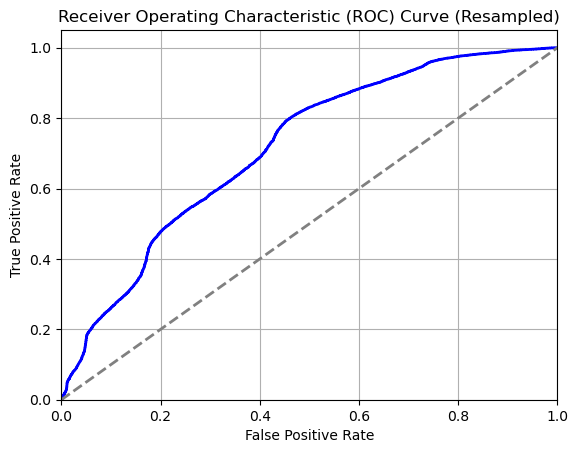

ROC AUC Score: 0.71


In [127]:
y_resampled_pred_prob = model.predict_proba(X_resampled_test)[:, 1]
fpr_resampled, tpr_resampled, thresholds_resampled = roc_curve(y_resampled_test, y_resampled_pred_prob)
roc_auc_resampled = auc(fpr_resampled, tpr_resampled)
plt.figure()
plt.plot(fpr_resampled, tpr_resampled, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')  # Diagonal line (random prediction)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve (Resampled)')
plt.grid()
plt.show()
print(f'ROC AUC Score: {roc_auc_score(y_resampled_test, y_resampled_pred_prob):.2f}')

Another visualisation for the ROC Curve, this time for the synthetic data for handling class imbalance. As you can see the ROC-AUC score has increased to 71%, whereas my initial ROC-AUC score was 65%.

# Cross Validation

In [130]:
from sklearn.model_selection import cross_val_score

# Perform 5-Fold Cross-Validation
cv_scores_acc = cross_val_score(model, X, y, cv=5, scoring='accuracy')
cv_scores_prec = cross_val_score(model, X, y, cv=5, scoring='precision')
cv_scores_rec = cross_val_score(model, X, y, cv=5, scoring='recall')
cv_scores_roc = cross_val_score(model, X, y, cv=5, scoring='roc_auc')

print(f'Cross-Validation Accuracy Scores: {cv_scores_acc}')
print(f'Mean CV Accuracy: {cv_scores_acc.mean()}')
print(f'Cross-Validation Precision Scores: {cv_scores_prec}')
print(f'Mean CV Precision: {cv_scores_prec.mean()}')
print(f'Cross-Validation Recall Scores: {cv_scores_rec}')
print(f'Mean CV Recall: {cv_scores_rec.mean()}')
print(f'Cross-Validation ROC-AUC Scores: {cv_scores_roc}')
print(f'Mean CV ROC-AUC: {cv_scores_roc.mean()}')

C:\Users\rubel\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\rubel\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

Cross-Validation Accuracy Scores: [0.87305434 0.87289277 0.87278505 0.87278505 0.87283206]
Mean CV Accuracy: 0.8728698533102666
Cross-Validation Precision Scores: [0.55813953 0.51315789 0.         0.         0.        ]
Mean CV Precision: 0.21425948592411262
Cross-Validation Recall Scores: [0.01016088 0.01651143 0.         0.         0.        ]
Mean CV Recall: 0.0053344623200677396
Cross-Validation ROC-AUC Scores: [0.70998349 0.6935967  0.63395284 0.64089208 0.65138065]
Mean CV ROC-AUC: 0.6659611524937533


C:\Users\rubel\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Above, I produced the cross validation scores of my initial model (without resampling) with a 5 fold cross-validation. This will simply take 5 different splits of training and testing sets from the dataframe and produce the evaluation metrics I want (Accuracy, Precision, Recal, ROC-AUC Score). It will then calculate the mean for each score.

After comparing the cross validation scores, I can see that my model performs better across different training and testing samples, with greater precision, recall and ROC scores.

# Challenger Model

## Data Preprocessing

Below I have removed all string type features as well as a few integer type features. This is because they either did not provide any valuable information about customers defaulting, or they were created by Andrea in class and I would rather use my own additional features. The type of modelling I am about to complete doesn't work very well when nulls are present in the dataset. This is because it can lead to innacurate training of the model. Hence I am going to be imputing these nulls using the algorithm shown in class.

In [134]:
df_challenger = df_clean.select_dtypes(exclude=['object'])\
                .drop(columns=["out_prncp", "out_prncp_inv",
                               "total_pymnt", "total_pymnt_inv", "funded_amnt", "funded_amnt_inv"])

print(f"Number of columns: {len(df_challenger.columns)}")

Number of columns: 108


In [135]:
pip install keras

Note: you may need to restart the kernel to use updated packages.


In [136]:
pip install tensorflow

Note: you may need to restart the kernel to use updated packages.


In [137]:
df_challenger.shape

(92834, 108)

The first part of the algorithm replaces all nulls in the specified columns with 0. The second part replaces all nulls in the specified columns with the features median value. The third part replaces the null values within the feature, 'mths_since_rcnt_il', with 999 because the customer may never have opened an account, hence we replace the null with such a large number assuming that the model interprets this extremely large number as a proxy for 'never'. I have then produced a list of all features which have nulls present.

In [139]:
# Group 1: Columns to be filled with 0
# Assuming these features represent counts or amounts where a missing value means zero
fill_zero_cols = [
    'tot_coll_amt', 'tot_cur_bal', 'open_acc_6m',
    'open_act_il', 'open_il_12m', 'open_il_24m',
    'total_bal_il', 'il_util', 'open_rv_12m', 'open_rv_24m', 'max_bal_bc',
    'all_util', 'inq_fi', 'total_cu_tl', 'acc_open_past_24mths',
    'num_actv_bc_tl', 'num_actv_rev_tl', 'num_bc_sats', 'num_bc_tl', 'num_il_tl',
    'num_op_rev_tl', 'num_rev_accts', 'num_rev_tl_bal_gt_0', 'num_sats',
    'num_tl_120dpd_2m', 'num_tl_30dpd', 'num_tl_90g_dpd_24m', 'num_tl_op_past_12m',
    'inq_last_12m', 'pub_rec_bankruptcies', 'mths_since_last_delinq', 'mths_since_recent_revol_delinq'
]
df_challenger[fill_zero_cols] = df_challenger[fill_zero_cols].fillna(0)

# Group 2: Columns to be filled with median
# (Assuming these features are numeric and can have a central tendency)
fill_median_cols = [
    'avg_cur_bal', 'bc_open_to_buy', 'bc_util', 'mo_sin_old_il_acct',
    'mo_sin_old_rev_tl_op', 'mo_sin_rcnt_rev_tl_op', 'mo_sin_rcnt_tl',
    'mort_acc', 'mths_since_recent_bc', 'mths_since_recent_inq',
    'pct_tl_nvr_dlq', 'percent_bc_gt_75', 'tot_hi_cred_lim',
    'total_bal_ex_mort', 'total_bc_limit', 'total_il_high_credit_limit', 'total_rev_hi_lim'
]
df_challenger[fill_median_cols] = df_challenger[fill_median_cols].apply(lambda x: x.fillna(x.median()))

# Group 3: Fill with 999
fill_nine_cols = [
     'mths_since_rcnt_il'
]
# Apply fill with 999
df_challenger[fill_nine_cols] = df_challenger[fill_nine_cols].fillna(999)

# Do a quick check on null values
df_challenger.columns[df_challenger.isna().sum() > 0]

Index(['mths_since_last_record', 'collections_12_mths_ex_med',
       'mths_since_last_major_derog', 'annual_inc_joint', 'dti_joint',
       'chargeoff_within_12_mths', 'mths_since_recent_bc_dlq',
       'num_accts_ever_120_pd', 'tax_liens', 'revol_bal_joint',
       'sec_app_fico_range_low', 'sec_app_fico_range_high',
       'sec_app_inq_last_6mths', 'sec_app_mort_acc', 'sec_app_open_acc',
       'sec_app_revol_util', 'sec_app_open_act_il', 'sec_app_num_rev_accts',
       'sec_app_chargeoff_within_12_mths',
       'sec_app_collections_12_mths_ex_med', 'deferral_term',
       'hardship_amount', 'hardship_length', 'hardship_dpd',
       'orig_projected_additional_accrued_interest',
       'hardship_payoff_balance_amount', 'hardship_last_payment_amount'],
      dtype='object')

After replacing the null values in most of the columns I had a look at what other columns had a significantly large number of null values.

In [141]:
df_challenger.isnull().sum()

id                                                0
loan_amnt                                         0
installment                                       0
annual_inc                                        0
dti                                               0
delinq_2yrs                                       0
fico_range_low                                    0
fico_range_high                                   0
inq_last_6mths                                    0
mths_since_last_delinq                            0
mths_since_last_record                        79077
open_acc                                          0
pub_rec                                           0
revol_bal                                         0
total_acc                                         0
total_rec_prncp                                   0
total_rec_int                                     0
total_rec_late_fee                                0
recoveries                                        0
collection_r

In [142]:
print(f"Number of columns: {len(df_challenger.columns)}")

Number of columns: 108


Previously, I had checked for features with significantly large null counts. I noticed that most of the features relating to joint applications showed null values above 75%. Hence, why I chose to set my threshold to 75%. The next piece of code removes all features will null values making up 75% of their data or more.

Caveat: I did not go and manually check every single feature and whether it would be more appropriate to replace nulls with 0, the median, 999, or drop the feature. I believe this would be extremely onerous for some 30+ features. I have completed a few steps to show that I understand the concept of this method with regards to preporcessing my data, and the fact that it is necessary to allow the model to train accurately.

In [144]:
threshold = 0.75
null_percentages = df_challenger.isnull().mean()
df_challenger = df_challenger.drop(columns=null_percentages[null_percentages > threshold].index)
print(f"Dropped columns: {null_percentages[null_percentages > threshold].index.tolist()}")
print(f"Number of columns: {len(df_challenger.columns)}")

Dropped columns: ['mths_since_last_record', 'annual_inc_joint', 'dti_joint', 'mths_since_recent_bc_dlq', 'revol_bal_joint', 'sec_app_fico_range_low', 'sec_app_fico_range_high', 'sec_app_inq_last_6mths', 'sec_app_mort_acc', 'sec_app_open_acc', 'sec_app_revol_util', 'sec_app_open_act_il', 'sec_app_num_rev_accts', 'sec_app_chargeoff_within_12_mths', 'sec_app_collections_12_mths_ex_med', 'deferral_term', 'hardship_amount', 'hardship_length', 'hardship_dpd', 'orig_projected_additional_accrued_interest', 'hardship_payoff_balance_amount', 'hardship_last_payment_amount']
Number of columns: 86


In [145]:
df_challenger.isnull().sum()
# to check my data preprocessing has worked

id                                    0
loan_amnt                             0
installment                           0
annual_inc                            0
dti                                   0
delinq_2yrs                           0
fico_range_low                        0
fico_range_high                       0
inq_last_6mths                        0
mths_since_last_delinq                0
open_acc                              0
pub_rec                               0
revol_bal                             0
total_acc                             0
total_rec_prncp                       0
total_rec_int                         0
total_rec_late_fee                    0
recoveries                            0
collection_recovery_fee               0
last_pymnt_amnt                       0
last_fico_range_high                  0
last_fico_range_low                   0
collections_12_mths_ex_med            6
mths_since_last_major_derog       69604
policy_code                           0


In [146]:
df_challenger.loan_default.value_counts()

loan_default
False    81025
True     11809
Name: count, dtype: int64

In [147]:
df_challenger.columns.tolist()
# to see what columns might be interesting enough to include in my model

['id',
 'loan_amnt',
 'installment',
 'annual_inc',
 'dti',
 'delinq_2yrs',
 'fico_range_low',
 'fico_range_high',
 'inq_last_6mths',
 'mths_since_last_delinq',
 'open_acc',
 'pub_rec',
 'revol_bal',
 'total_acc',
 'total_rec_prncp',
 'total_rec_int',
 'total_rec_late_fee',
 'recoveries',
 'collection_recovery_fee',
 'last_pymnt_amnt',
 'last_fico_range_high',
 'last_fico_range_low',
 'collections_12_mths_ex_med',
 'mths_since_last_major_derog',
 'policy_code',
 'acc_now_delinq',
 'tot_coll_amt',
 'tot_cur_bal',
 'open_acc_6m',
 'open_act_il',
 'open_il_12m',
 'open_il_24m',
 'mths_since_rcnt_il',
 'total_bal_il',
 'il_util',
 'open_rv_12m',
 'open_rv_24m',
 'max_bal_bc',
 'all_util',
 'total_rev_hi_lim',
 'inq_fi',
 'total_cu_tl',
 'inq_last_12m',
 'acc_open_past_24mths',
 'avg_cur_bal',
 'bc_open_to_buy',
 'bc_util',
 'chargeoff_within_12_mths',
 'delinq_amnt',
 'mo_sin_old_il_acct',
 'mo_sin_old_rev_tl_op',
 'mo_sin_rcnt_rev_tl_op',
 'mo_sin_rcnt_tl',
 'mort_acc',
 'mths_since_recen

In [149]:
features = ['fico_range_high', 'fico_range_low', 'annual_inc',
            'dti', 'int_rate_clean', 'term_numeric', 'revol_util_clean',
            'loan_amnt', 'grade_encoded', 'home_ownership_numeric',
            'delinq_2yrs', 'open_acc', 'recoveries', 'tot_cur_bal',
            'mort_acc', 'total_rec_prncp', 'total_rec_int', 'total_rec_late_fee',
            'delinq_amnt', 'last_fico_range_high', 'last_fico_range_low']

X = df_challenger[features]
y = df_challenger['loan_default']

print(f"Number of features: {len(features)}")

Number of features: 21


In [150]:
X_resampled_1, y_resampled_1 = smote.fit_resample(X, y)

C:\Users\rubel\anaconda3\Lib\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning: Could not find the number of physical cores for the following reason:
[WinError 2] The system cannot find the file specified
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "C:\Users\rubel\anaconda3\Lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
               ^^^^^^^^^^^^^^^
  File "C:\Users\rubel\anaconda3\Lib\subprocess.py", line 548, in run
    with Popen(*popenargs, **kwargs) as process:
         ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\rubel\anaconda3\Lib\subprocess.py", line 1026, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
  File "C:\Users\rubel\anaconda3\Lib\subprocess.py", line 1538, in _execute_child
    hp, ht, pid, tid = _winapi.CreatePro

In [151]:
X.head()

,fico_range_high,fico_range_low,annual_inc,dti,int_rate_clean,term_numeric,revol_util_clean,loan_amnt,grade_encoded,home_ownership_numeric,delinq_2yrs,open_acc,recoveries,tot_cur_bal,mort_acc,total_rec_prncp,total_rec_int,total_rec_late_fee,delinq_amnt,last_fico_range_high,last_fico_range_low
0,669.00,665.00,48000.00,20.25,0.13,36.00,0.83,4000.00,1,4,1.00,4.00,0.00,259024.00,2.00,183.66,83.29,0.00,0.00,669.00,665.00
1,684.00,680.00,57000.00,25.33,0.09,60.00,0.65,24000.00,1,3,0.00,10.00,0.00,61815.00,0.00,19666.71,5829.45,0.00,0.00,704.00,700.00
2,669.00,665.00,55000.00,7.22,0.10,36.00,0.53,5000.00,1,4,0.00,7.00,0.00,159131.00,1.00,5000.00,846.67,0.00,0.00,789.00,785.00
3,754.00,750.00,43500.00,24.55,0.11,60.00,0.12,24000.00,1,4,0.00,15.00,0.00,104590.00,2.00,7682.31,4318.62,0.00,0.00,749.00,745.00
4,739.00,735.00,48000.00,24.30,0.14,60.00,0.27,14000.00,2,4,0.00,16.00,0.00,90253.00,2.00,14000.00,2605.68,0.00,0.00,779.00,775.00


In [152]:
from sklearn.preprocessing import MinMaxScaler

# Apply Min-Max Scaling
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X_resampled_1)

# Convert back to DataFrame with same column names
X_scaled_df = pd.DataFrame(X_scaled, columns=features)
X_scaled_df.head()

,fico_range_high,fico_range_low,annual_inc,dti,int_rate_clean,term_numeric,revol_util_clean,loan_amnt,grade_encoded,home_ownership_numeric,delinq_2yrs,open_acc,recoveries,tot_cur_bal,mort_acc,total_rec_prncp,total_rec_int,total_rec_late_fee,delinq_amnt,last_fico_range_high,last_fico_range_low
0,0.12,0.12,0.27,0.47,0.37,0.00,0.66,0.09,0.17,1.00,0.06,0.05,0.00,0.06,0.04,0.00,0.00,0.00,0.00,0.79,0.79
1,0.19,0.20,0.32,0.59,0.18,1.00,0.51,0.62,0.17,0.67,0.00,0.12,0.00,0.02,0.00,0.49,0.18,0.00,0.00,0.83,0.83
2,0.12,0.12,0.31,0.17,0.25,0.00,0.42,0.12,0.17,1.00,0.00,0.08,0.00,0.04,0.02,0.12,0.03,0.00,0.00,0.93,0.93
3,0.53,0.54,0.24,0.57,0.27,1.00,0.10,0.62,0.17,1.00,0.00,0.17,0.00,0.03,0.04,0.19,0.14,0.00,0.00,0.88,0.88
4,0.46,0.46,0.27,0.57,0.40,1.00,0.22,0.36,0.33,1.00,0.00,0.19,0.00,0.02,0.04,0.35,0.08,0.00,0.00,0.92,0.92


In [153]:
from sklearn.model_selection import train_test_split

# Split the data into training and testing sets (returns pandas dfs)
X_train_1, X_test_1, y_train_1, y_test_1 = train_test_split(X_scaled_df, y_resampled_1, test_size=0.2, random_state=23)

In [263]:
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Dropout

# Initialize the model
model_3 = Sequential()

# First hidden layer
model_3.add(Dense(16, input_dim=X_scaled_df.shape[1], activation='relu'))

# Second hidden layer
model_3.add(Dense(10, activation='relu'))

# Third hidden layer
model_3.add(Dense(6, activation='relu'))

# Output layer
model_3.add(Dense(1, activation='sigmoid'))

# Compile the model
model_3.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy', 'Precision', 'Recall', 'AUC']
)

history_3 = model_3.fit(X_train_1, y_train_1, epochs=10, batch_size=32, validation_split=0.2)

Epoch 1/10


C:\Users\rubel\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3241/3241 ━━━━━━━━━━━━━━━━━━━━ 8s 2ms/step - AUC: 0.9220 - Precision: 0.8361 - Recall: 0.9042 - accuracy: 0.8539 - loss: 0.3212 - val_AUC: 0.9901 - val_Precision: 0.9383 - val_Recall: 0.9751 - val_accuracy: 0.9557 - val_loss: 0.1280
Epoch 2/10
3241/3241 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - AUC: 0.9908 - Precision: 0.9645 - Recall: 0.9582 - accuracy: 0.9614 - loss: 0.1117 - val_AUC: 0.9933 - val_Precision: 0.9655 - val_Recall: 0.9681 - val_accuracy: 0.9669 - val_loss: 0.0980
Epoch 3/10
3241/3241 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - AUC: 0.9931 - Precision: 0.9713 - Recall: 0.9594 - accuracy: 0.9655 - loss: 0.0978 - val_AUC: 0.9951 - val_Precision: 0.9810 - val_Recall: 0.9578 - val_accuracy: 0.9698 - val_loss: 0.0840
Epoch 4/10
3241/3241 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - AUC: 0.9952 - Precision: 0.9762 - Recall: 0.9635 - accuracy: 0.9701 - loss: 0.0825 - val_AUC: 0.9962 - val_Precision: 0.9631 - val_Recall: 0.9818 - val_accuracy: 0.9722 - val_loss: 0.0808
Epoch 5/10
3241/3241 ━━━━━━━━━━━━━━

In [264]:
y_prob3 = model_3.predict(X_test_1)
y_pred3 = (y_prob3 > 0.5)
from dsif6utility import model_evaluation_report
model_evaluation_report(X_test_1, y_test_1, y_pred3, y_prob3)

1013/1013 ━━━━━━━━━━━━━━━━━━━━ 1s 777us/step
Accuracy: 0.9771366862079605
Precision: 0.9720748734833242
Recall: 0.9825588561567854
F1-Score: 0.9772887485824624
ROC-AUC: 0.9972418216639547
Confusion Matrix:
[[15726   458]
 [  283 15943]]


In [265]:
y_prob3 = pd.DataFrame(y_prob3, columns=["prob3"])
y_prob3.prob3.describe(percentiles = [i / 100 for i in [0, 1, 10, 25, 50, 75, 90, 95, 99, 100]])

count   32410.00
mean        0.52
std         0.48
min         0.00
0%          0.00
1%          0.00
10%         0.00
25%         0.00
50%         0.61
75%         1.00
90%         1.00
95%         1.00
99%         1.00
100%        1.00
max         1.00
Name: prob3, dtype: float64

In [266]:
history_3.history['val_AUC']

[0.9900875687599182,
 0.9932830929756165,
 0.9951338171958923,
 0.9961606860160828,
 0.9965640306472778,
 0.9960407018661499,
 0.9967538118362427,
 0.9970688819885254,
 0.9967721700668335,
 0.9970278739929199]

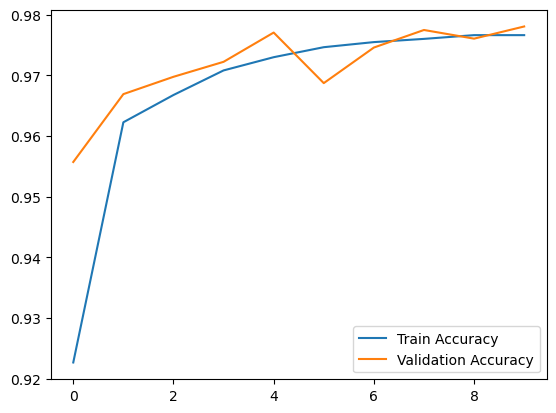

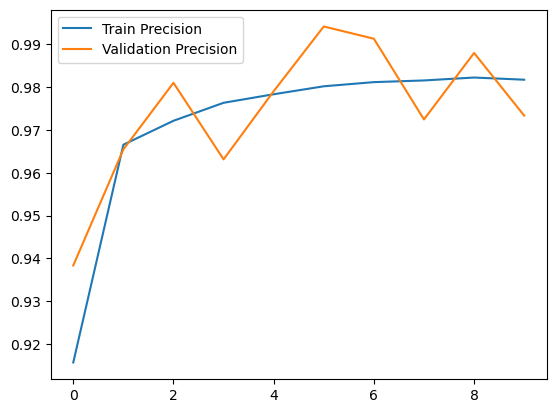

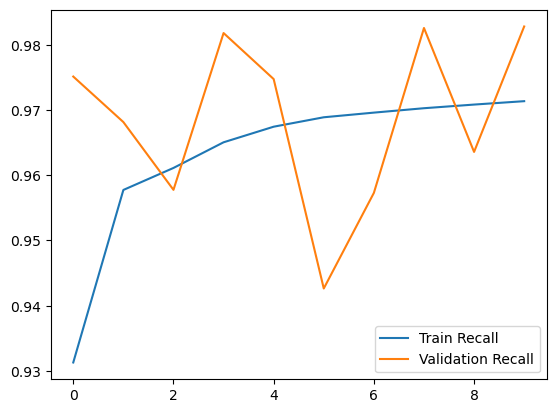

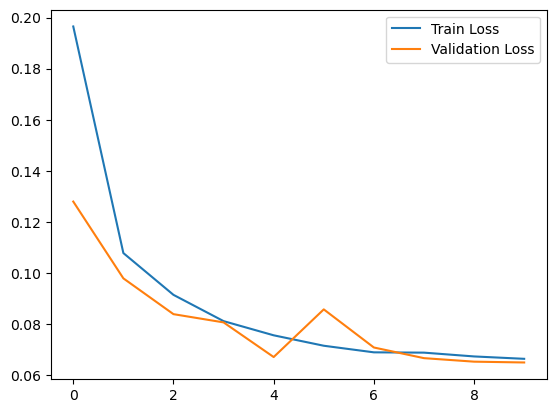

In [267]:
def plot_training_vs_overfitting(history_3):
    """Plot training and validation accuracy to detect overfitting (when gap between 2 is detected)"""
    import matplotlib.pyplot as plt

    # Plot accuracy
    plt.plot(history_3.history['accuracy'], label='Train Accuracy')
    plt.plot(history_3.history['val_accuracy'], label='Validation Accuracy')
    plt.legend()
    plt.show()

     # Plot precision
    plt.plot(history_3.history['Precision'], label='Train Precision')
    plt.plot(history_3.history['val_Precision'], label='Validation Precision')
    plt.legend()
    plt.show()

    # Plot recall
    plt.plot(history_3.history['Recall'], label='Train Recall')
    plt.plot(history_3.history['val_Recall'], label='Validation Recall')
    plt.legend()
    plt.show()

    # Plot loss
    plt.plot(history_3.history['loss'], label='Train Loss')
    plt.plot(history_3.history['val_loss'], label='Validation Loss')
    plt.legend()
    plt.show()

plot_training_vs_overfitting(history_3)